In [1]:
required_packages <- c("plgp", "lhs", "mvtnorm", "laGP")
install.packages(setdiff(required_packages, rownames(installed.packages())))

In [2]:
library(plgp)
library(lhs)
library(mvtnorm)
library(dplyr)
#library(tidyverse)
library(plotly)

Loading required package: mvtnorm

Loading required package: tgp


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




## 5.1 Gaussian process prior

In [3]:
eps <- sqrt(.Machine$double.eps)
eps

[1] 1.490116e-08

In [4]:
n <- 100
X <- matrix(seq(0, 10, length=n), ncol=1)

In [5]:
D <- distance(X)
Sigma <- exp(-D) + diag(eps, n)

In [6]:
set.seed(2)
Y <- rmvnorm(1, sigma=Sigma)
Y

0.122442,0.2761205,0.4279733,0.5747853,0.7125841,0.8342195,0.9330454,1.00375,1.045364,1.060128,⋯,-0.5750525,-0.5849447,-0.6278315,-0.6895679,-0.7550723,-0.8109438,-0.8486212,-0.8672454,-0.8699046,-0.863811


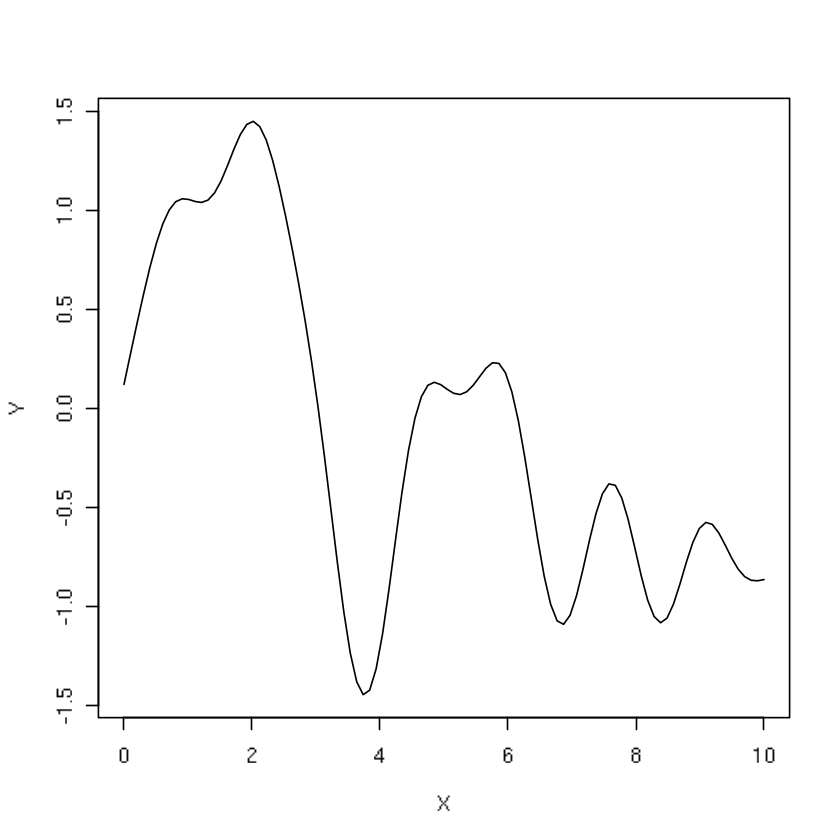

In [7]:
plot(X, Y, type="l")

In [8]:
c(exp(-1^2), exp(-4^2))

[1] 3.678794e-01 1.125352e-07

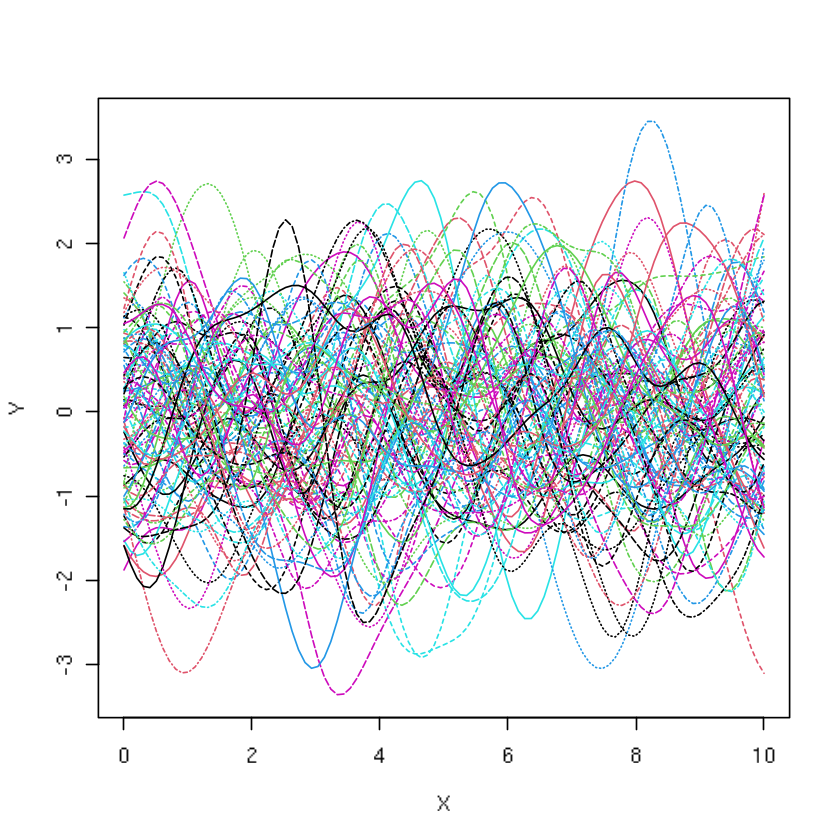

In [8]:
set.seed(3)
Y <- rmvnorm(100, sigma=Sigma)
matplot(X, t(Y), type="l", ylab="Y")

### 5.1.1 Gaussian process posterior

In [9]:
n <- 8
X <- matrix(seq(0, 2*pi, length=n), ncol=1)  # train X
y <- sin(X) # train y
D <- distance(X)  # distance X
Sigma <- exp(-D) + diag(eps, ncol(D))  # sigma X

In [10]:
Sigma

1.000000e+00,4.467831e-01,3.984621e-02,7.093667e-04,2.520856e-06,1.788212e-09,2.532114e-13,7.157166e-18
4.467831e-01,1.000000e+00,4.467831e-01,3.984621e-02,7.093667e-04,2.520856e-06,1.788212e-09,2.532114e-13
3.984621e-02,4.467831e-01,1.000000e+00,4.467831e-01,3.984621e-02,7.093667e-04,2.520856e-06,1.788212e-09
7.093667e-04,3.984621e-02,4.467831e-01,1.000000e+00,4.467831e-01,3.984621e-02,7.093667e-04,2.520856e-06
2.520856e-06,7.093667e-04,3.984621e-02,4.467831e-01,1.000000e+00,4.467831e-01,3.984621e-02,7.093667e-04
1.788212e-09,2.520856e-06,7.093667e-04,3.984621e-02,4.467831e-01,1.000000e+00,4.467831e-01,3.984621e-02
2.532114e-13,1.788212e-09,2.520856e-06,7.093667e-04,3.984621e-02,4.467831e-01,1.000000e+00,4.467831e-01
7.157166e-18,2.532114e-13,1.788212e-09,2.520856e-06,7.093667e-04,3.984621e-02,4.467831e-01,1.000000e+00


In [11]:
XX <- matrix(seq(-5.5, 2*pi + 5.5, length=100), ncol=1) # test XX
DXX <- distance(XX)
SXX <- exp(-DXX) + diag(eps, ncol(DXX))

In [12]:
DX <- distance(XX, X)
SX <- exp(-DX) 

In [13]:
Si <- solve(Sigma)
mup <- SX %*% Si %*% y
Sigmap <- SXX - SX %*% Si %*% t(SX)

In [14]:
set.seed(1)
YY <- rmvnorm(100, mup, Sigmap)

In [15]:
q1 <- mup + qnorm(0.05, 0, sqrt(diag(Sigmap)))
q2 <- mup + qnorm(0.95, 0, sqrt(diag(Sigmap)))

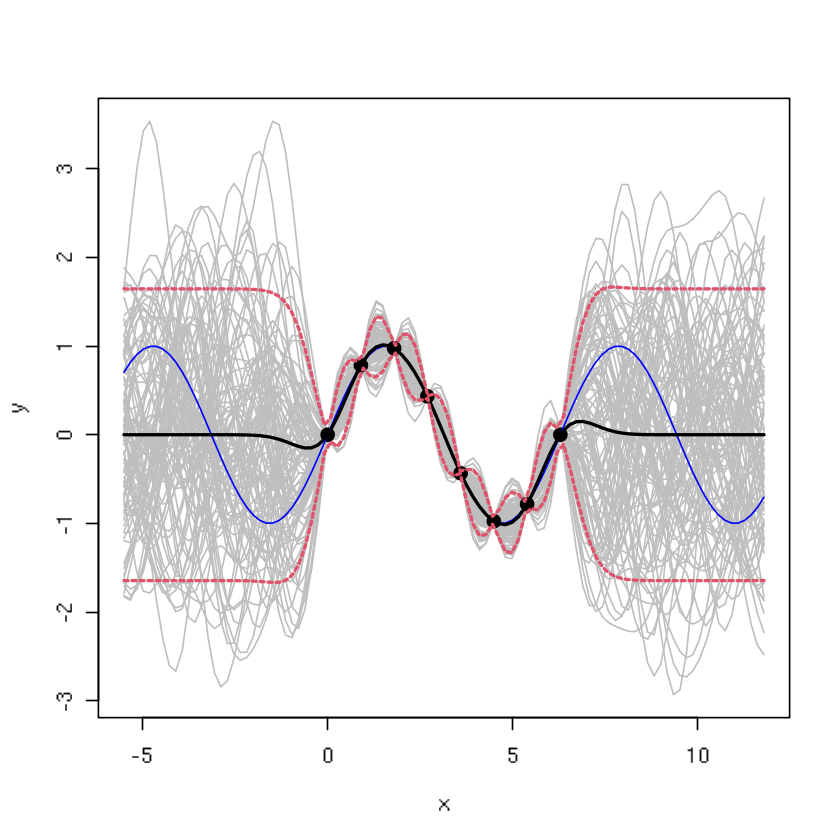

In [16]:
matplot(XX, t(YY), type="l", col="gray", lty=1, xlab="x", ylab="y")
points(X, y, pch=20, cex=2)
lines(XX, sin(XX), col="blue")
lines(XX, mup, lwd=2)
lines(XX, q1, lwd=2, lty=2, col=2)
lines(XX, q2, lwd=2, lty=2, col=2)

### 5.1.2 Higher dimension?

In [17]:
nx <- 100
x <- seq(0, 2, length=nx)
X <- expand.grid(x, x)
D <- distance(X)

In [18]:
D <- distance(X)
Sigma <- exp(-D) + diag(eps, nrow(X))

In [19]:
set.seed(5)
Y <- rmvnorm(2, sigma=Sigma)

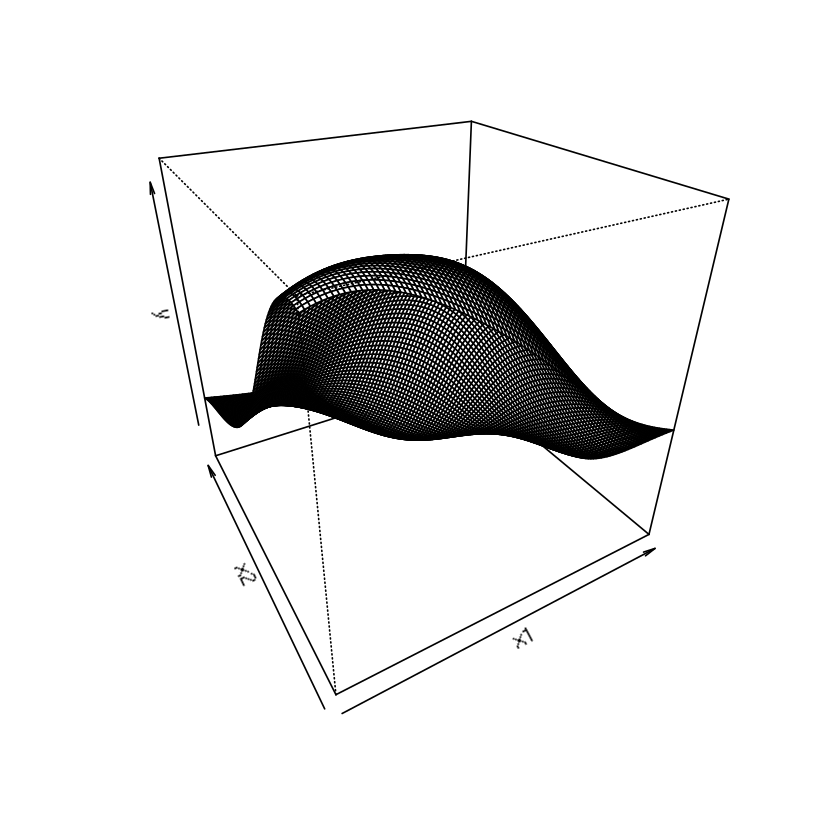

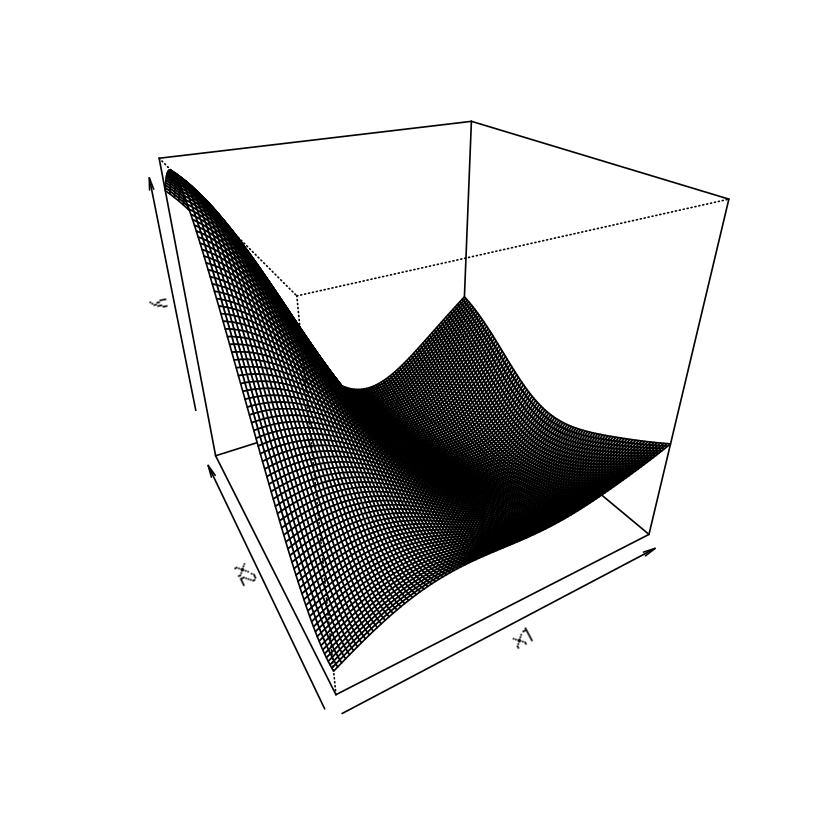

In [21]:
#par(mfrow=c(1, 2))
persp(x, x, matrix(Y[1,], ncol=nx), theta=-30, phi=30, xlab="x1", 
  ylab="x2", zlab="y")
persp(x, x, matrix(Y[2,], ncol=nx), theta=-30, phi=30, xlab="x1", 
  ylab="x2", zlab="y")

In [22]:
plot_ly(x = ~ -x, y = ~x, z = ~matrix(Y[2,], ncol=length(x))) %>% 
add_surface()

HTML widgets cannot be represented in plain text (need html)

In [467]:
library(lhs)
set.seed(31231)
X <- randomLHS(40, 2)
X[,1] <- (X[,1] - 0.5)*6 + 1
X[,2] <- (X[,2] - 0.5)*6 + 1
y <- X[,1]*exp(-X[,1]^2 - X[,2]^2)

In [468]:
xx <- seq(-2, 4, length=40)
XX <- expand.grid(xx, xx)

In [469]:
D <- distance(X)
Sigma <- exp(-D) + diag(eps, ncol(D))

In [470]:
DXX <- distance(XX)
SXX <- exp(-DXX) + diag(eps, ncol(DXX))
DX <- distance(XX, X)
SX <- exp(-DX)

In [471]:
Si <- solve(Sigma)
mup <- SX %*% Si %*% y
Sigmap <- SXX - SX %*% Si %*% t(SX)

In [472]:
sdp <- sqrt(diag(Sigmap))

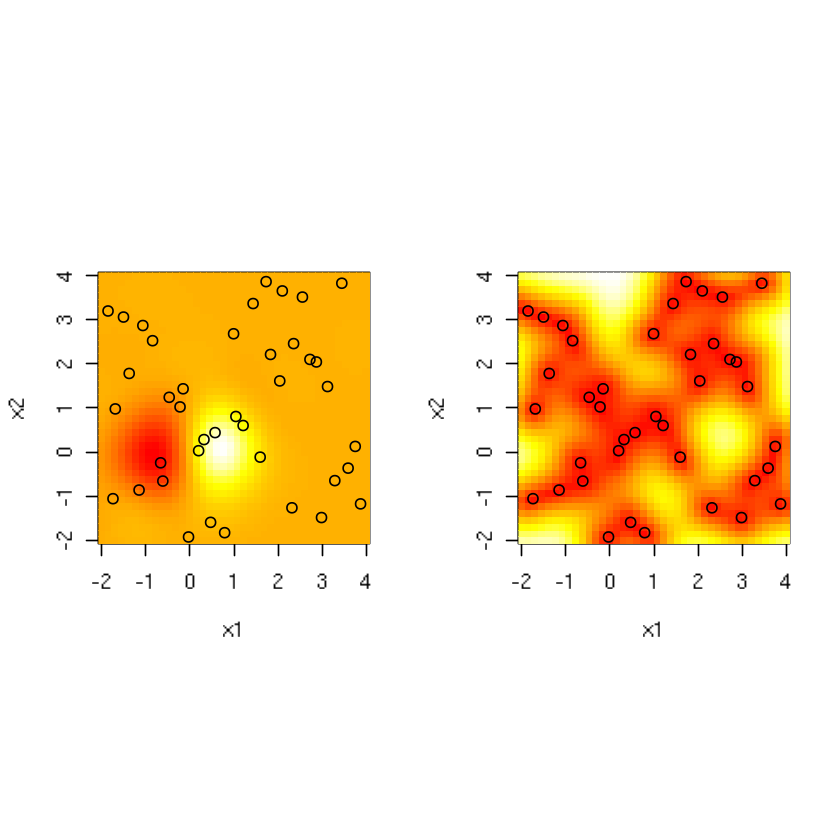

In [473]:
par(pty="s")
par(mfrow=c(1,2))
cols <- heat.colors(128)
image(xx, xx, matrix(mup, ncol=length(xx)), xlab="x1", ylab="x2", col=cols)
points(X[,1], X[,2])
image(xx, xx, matrix(sdp, ncol=length(xx)), xlab="x1", ylab="x2", col=cols)
points(X[,1], X[,2])

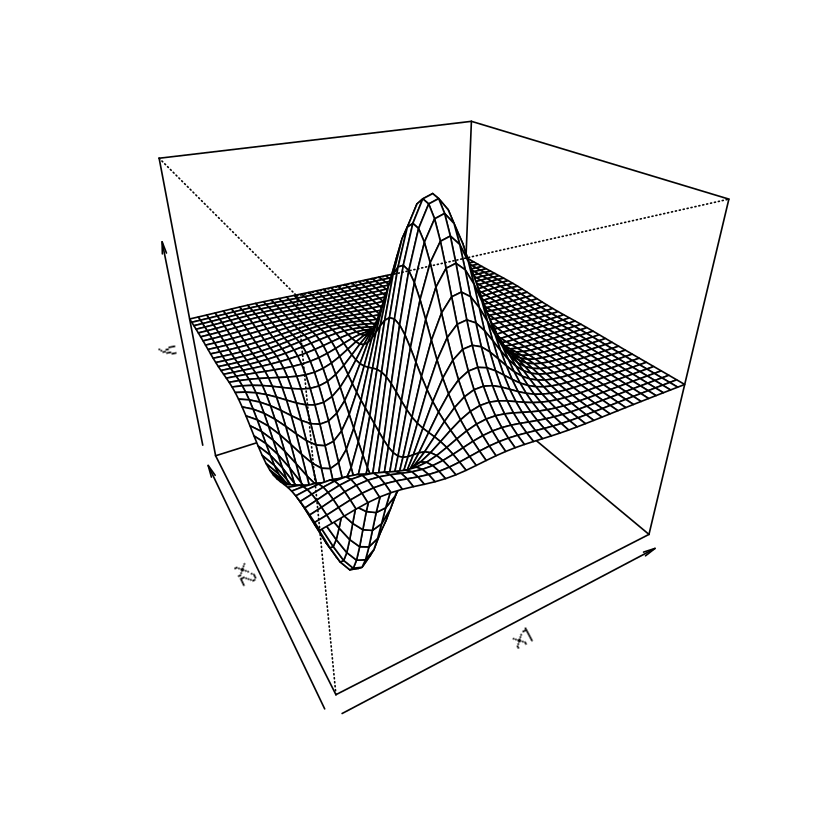

In [474]:
persp(xx, xx, matrix(mup, ncol=40), theta=-30, phi=30, xlab="x1", 
  ylab="x2", zlab="y")

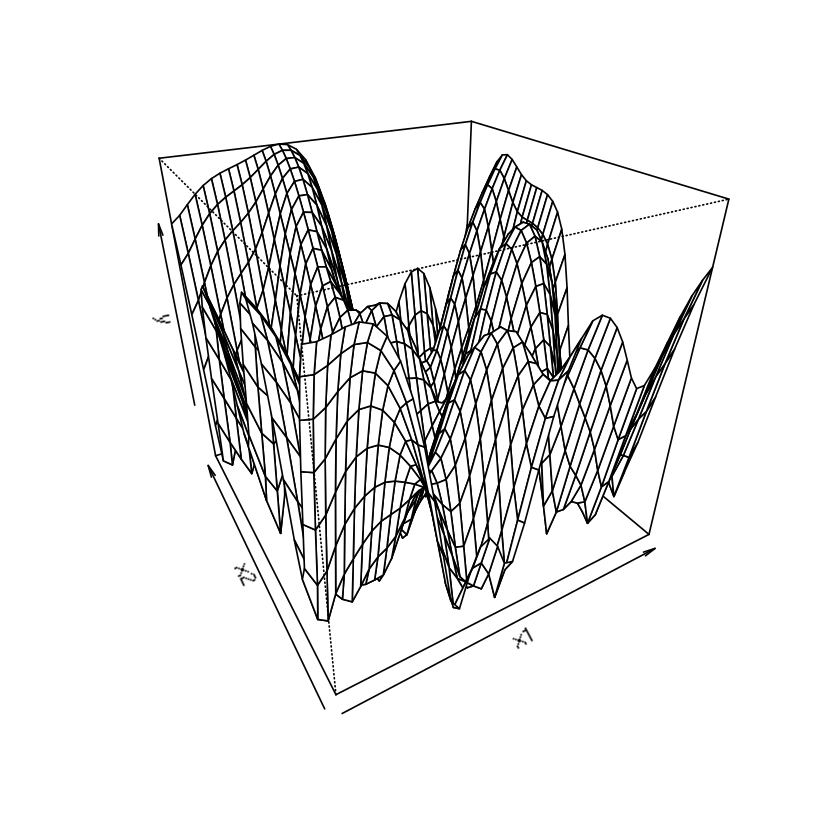

In [475]:
persp(xx, xx, matrix(sdp, ncol=40), theta=-30, phi=30, xlab="x1", 
  ylab="x2", zlab="y")

In [476]:
plot_ly(x = ~-xx, y = ~xx, z = ~matrix(mup, nrow=40)) %>% 
add_surface()

HTML widgets cannot be represented in plain text (need html)

## 5.2 GP hyperparameters

### 5.2.1 Scale

In [477]:
n <- 100
X <- matrix(seq(0, 10, length=n), ncol=1)
D <- distance(X)

In [478]:
C <- exp(-D) + diag(eps, n) 
tau2 <- 5
set.seed(3412)
Y <- rmvnorm(100, sigma=tau2*C)

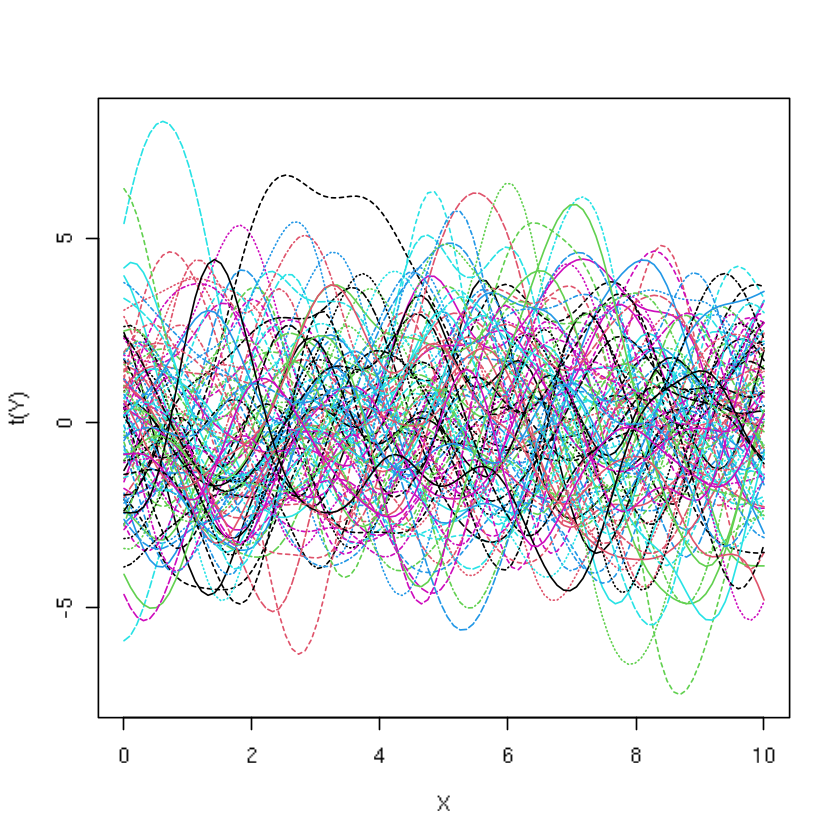

In [479]:
matplot(X, t(Y), type="l")

In [480]:
n <- 8
X <- matrix(seq(0, 2*pi, length=n), ncol=1)
y <- 5*sin(X)

In [481]:
D <- distance(X)
Sigma <- exp(-D)
XX <- matrix(seq(-5.5, 2*pi + 5.5, length=100), ncol=1)
DXX <- distance(XX)
SXX <- exp(-DXX) + diag(eps, ncol(DXX))
DX <- distance(XX, X)
SX <- exp(-DX)
Si <- solve(Sigma); 
mup <- SX %*% Si %*% y
Sigmap <- SXX - SX %*% Si %*% t(SX)

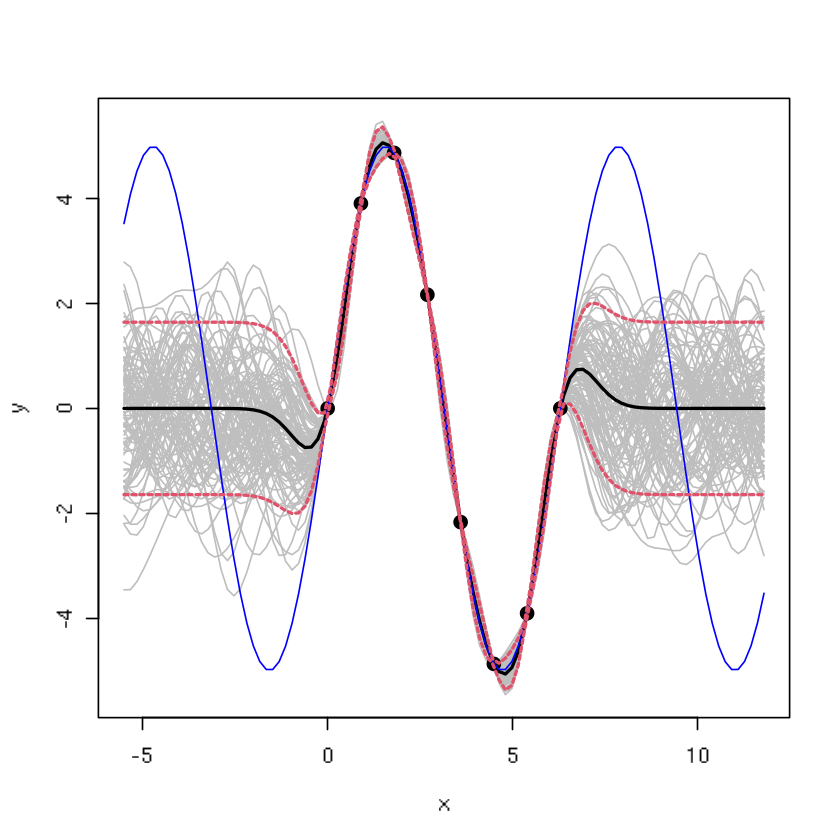

In [482]:
set.seed(4123)
YY <- rmvnorm(100, mup, Sigmap)
q1 <- mup + qnorm(0.05, 0, sqrt(diag(Sigmap)))
q2 <- mup + qnorm(0.95, 0, sqrt(diag(Sigmap)))
matplot(XX, t(YY), type="l", col="gray", lty=1, xlab="x", ylab="y")
points(X, y, pch=20, cex=2)
lines(XX, mup, lwd=2)
lines(XX, 5*sin(XX), col="blue")
lines(XX, q1, lwd=2, lty=2, col=2)
lines(XX, q2, lwd=2, lty=2, col=2)

In [483]:
CX <- SX
Ci <- Si
CXX <- SXX
tau2hat <- drop(t(y) %*% Ci %*% y / length(y))

In [484]:
2*sqrt(tau2hat)

[1] 5.486648

In [485]:
mup2 <- CX %*% Ci %*% y
Sigmap2 <- tau2hat*(CXX - CX %*% Ci %*% t(CX))
set.seed(312)
YY <- rmvnorm(100, mup2, Sigmap2)
q1 <- mup + qnorm(0.05, 0, sqrt(diag(Sigmap2)))
q2 <- mup + qnorm(0.95, 0, sqrt(diag(Sigmap2)))

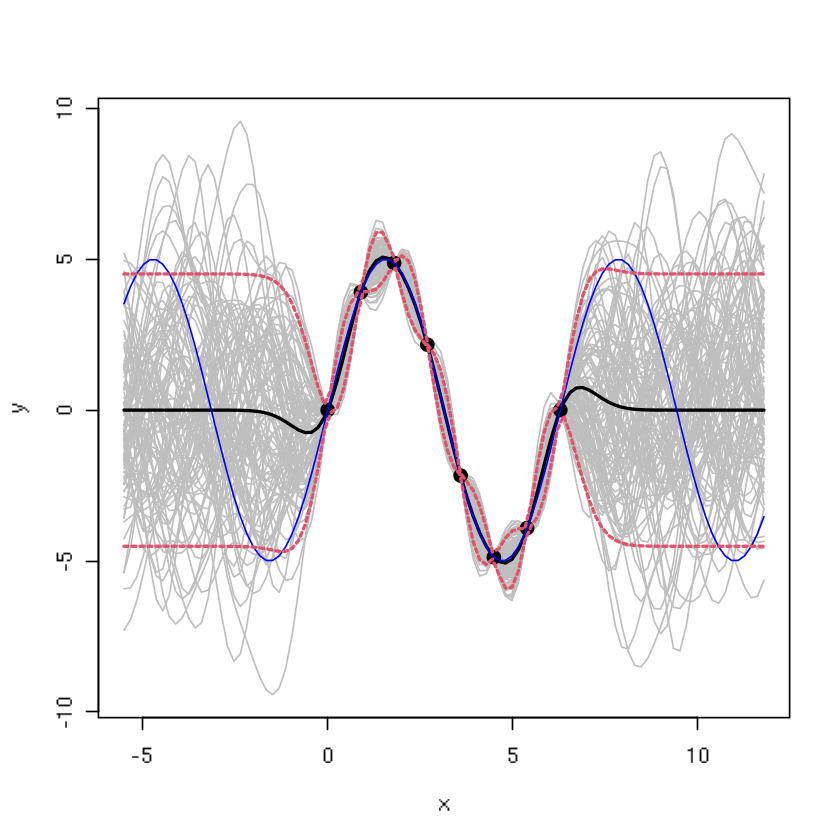

In [486]:
matplot(XX, t(YY), type="l", col="gray", lty=1, xlab="x", ylab="y")
points(X, y, pch=20, cex=2)
lines(XX, mup, lwd=2)
lines(XX, 5*sin(XX), col="blue")
lines(XX, q1, lwd=2, lty=2, col=2); lines(XX, q2, lwd=2, lty=2, col=2)

In [487]:
score <- function(Y, mu, Sigma, mah=FALSE) {
  Ymmu <- Y - mu
  Sigmai <- solve(Sigma)
  mahdist <- t(Ymmu) %*% Sigmai %*% Ymmu
  if (mah) return(sqrt(mahdist))
  return (- determinant(Sigma, logarithm=TRUE)$modulus - mahdist)
}

In [488]:
Ytrue <- 5*sin(XX)
df <- data.frame(score(Ytrue, mup, Sigmap, mah=TRUE),
                 score(Ytrue, mup2, Sigmap2, mah=TRUE))
colnames(df) <- c("tau2=1", "tau2hat")
df

tau2=1,tau2hat
<dbl>,<dbl>
10.63097,3.875215


In [489]:
Ytrue <- 5*sin(XX)
df <- data.frame(score(Ytrue, mup, Sigmap, mah=FALSE),
                 score(Ytrue, mup2, Sigmap2, mah=FALSE))
colnames(df) <- c("tau2=1", "tau2hat")
df

tau2=1,tau2hat
<dbl>,<dbl>
1118.029,1014.195


### 5.2.2 Noise and nuggets

In [490]:
nlg <- function(g, D, Y) {
  n <- length(Y)
  K <- exp(-D) + diag(g, n)
  Ki <- solve(K)
  ldetK <- determinant(K, logarithm=TRUE)$modulus
  ll <- - (n/2)*log(t(Y) %*% Ki %*% Y) - (1/2)*ldetK
  counter <<- counter + 1
  return(-ll)
}

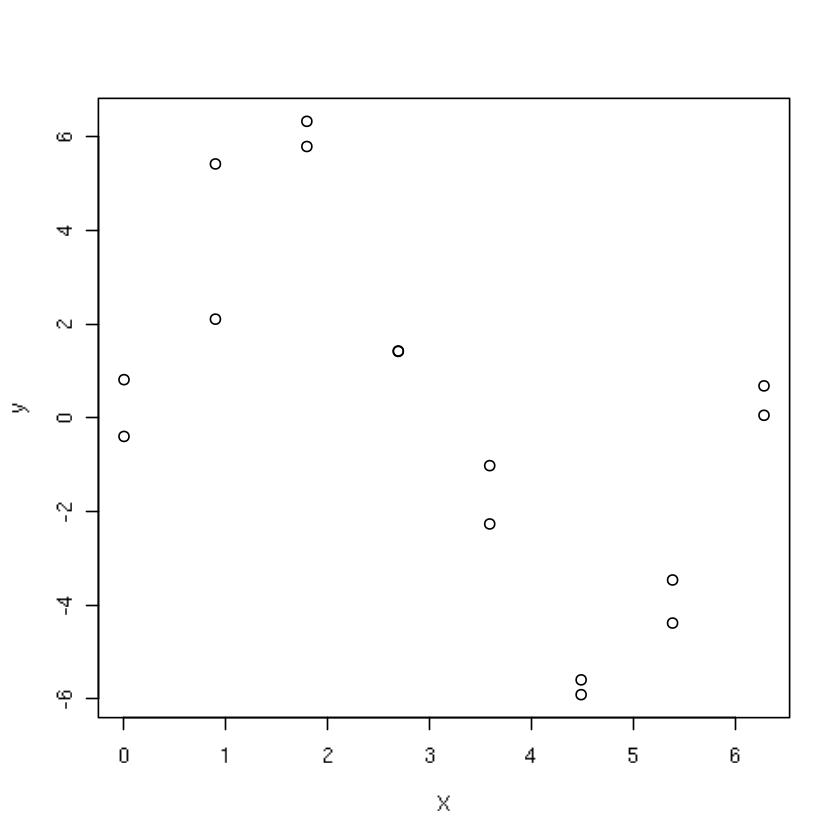

In [491]:
n <- 8  # 8 or 1000
X <- matrix(seq(0, 2*pi, length=n), ncol=1)
X <- rbind(X, X)
n <- nrow(X)
#set.seed(312312)
set.seed(312)
y <- 5*sin(X) + rnorm(n, sd=1)
D <- distance(X)
plot(X, y)

In [492]:
counter <- 0
g <- optimize(nlg, interval=c(eps, var(y)), D=D, Y=y)$minimum
g

[1] 0.09913465

In [493]:
counter

[1] 20

In [494]:
K <- exp(-D) + diag(g, n)
Ki <- solve(K)
tau2hat <- drop(t(y) %*% Ki %*% y / n)
c(tau=sqrt(tau2hat), sigma=sqrt(tau2hat*g))

tau     sigma 
3.0950678 0.9745024

In [495]:
XX <- matrix(seq(-5.5, 2*pi + 5.5, length=100), ncol=1)
DXX <- distance(XX)

In [496]:
DX <- distance(XX, X)
KX <- exp(-DX)
KXX <- exp(-DXX) + diag(g, nrow(DXX))

In [497]:
mup <- KX %*% Ki %*% y
Sigmap <- tau2hat*(KXX - KX %*% Ki %*% t(KX))
q1 <- mup + qnorm(0.05, 0, sqrt(diag(Sigmap)))
q2 <- mup + qnorm(0.95, 0, sqrt(diag(Sigmap)))

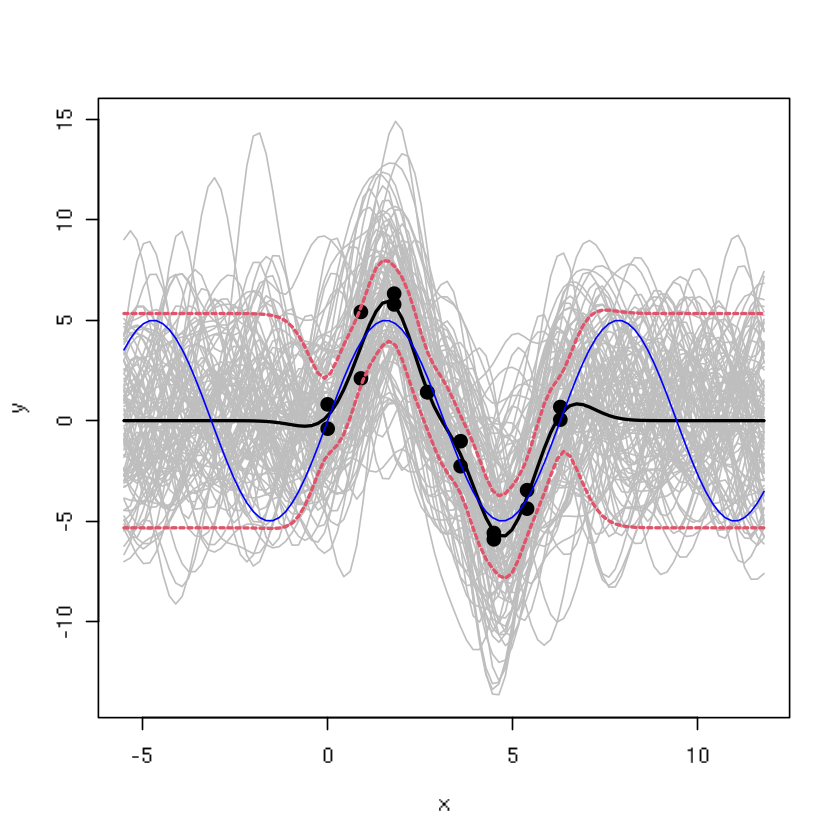

In [498]:
# with idiosyncratic noise: 노이즈로 데이터 포인트 위아래로 분산이 크다
Sigma.int <- tau2hat*(exp(-DXX) + diag(eps, nrow(DXX)) )
# Sigma.int <- tau2hat*(exp(-DXX) + diag(eps, nrow(DXX))
#   - KX %*% Ki %*% t(KX))
set.seed(3123)
YY <- rmvnorm(100, mup, Sigma.int)
matplot(XX, t(YY), type="l", lty=1, col="gray", xlab="x", ylab="y")
points(X, y, pch=20, cex=2)
lines(XX, mup, lwd=2)
lines(XX, 5*sin(XX), col="blue")
lines(XX, q1, lwd=2, lty=2, col=2)
lines(XX, q2, lwd=2, lty=2, col=2)

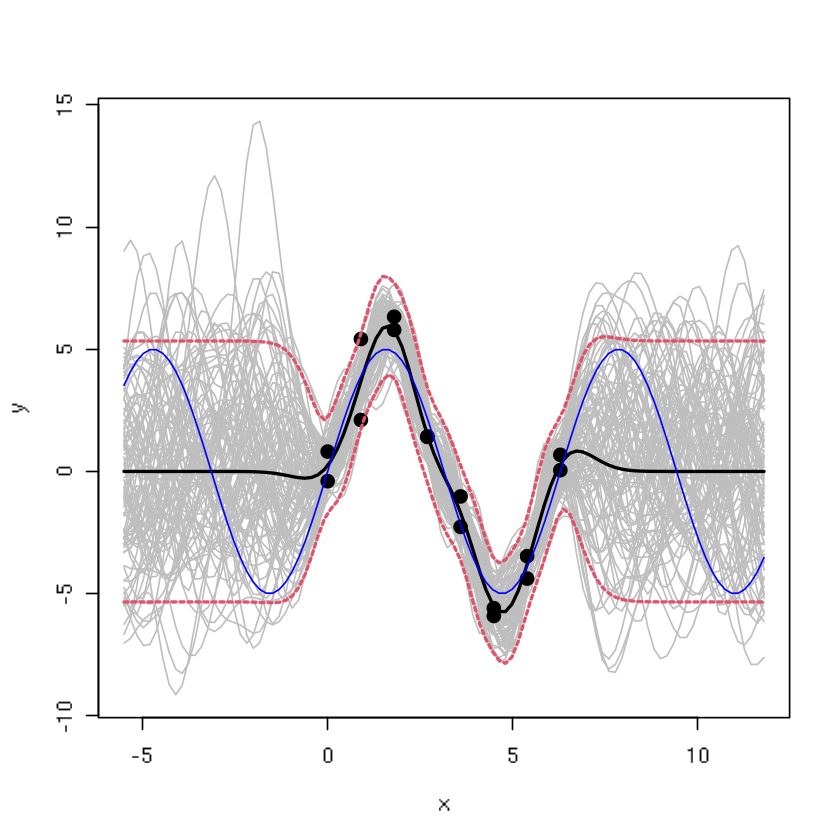

In [499]:
# subtracting out idiosyncratic noise: 데이터 포인트에서 분산 감소
#Sigma.int <- tau2hat*(exp(-DXX) + diag(eps, nrow(DXX)) )
Sigma.int <- tau2hat*(exp(-DXX) + diag(eps, nrow(DXX))
  - KX %*% Ki %*% t(KX))
set.seed(3123)
YY <- rmvnorm(100, mup, Sigma.int)
matplot(XX, t(YY), type="l", lty=1, col="gray", xlab="x", ylab="y")
points(X, y, pch=20, cex=2)
lines(XX, mup, lwd=2)
lines(XX, 5*sin(XX), col="blue")
lines(XX, q1, lwd=2, lty=2, col=2)
lines(XX, q2, lwd=2, lty=2, col=2)

### 5.2.3 Derivative-based hyperparameter optimization

In [500]:
nlg.count <- counter
nlg.count

[1] 20

In [501]:
sqrt(5)

[1] 2.236068

In [502]:
gnlg <- function(g, D, Y) {
  n <- length(Y)
  K <- exp(-D) + diag(g, n)
  Ki <- solve(K)
  KiY <- Ki %*% Y
  dll <- (n/2) * t(KiY) %*% KiY / (t(Y) %*% KiY) - (1/2)*sum(diag(Ki))
  return(-dll)
}

In [503]:
counter <- 0
out <- optim(0.1*var(y), nlg, gnlg, method="L-BFGS-B", lower=eps, upper=var(y), D=D, Y=y)
c(g, out$par)

[1] 0.09913465 0.09914343

In [504]:
c(out$counts, actual=counter)

function gradient   actual 
      13       13       13

### 5.2.4 Lengthscale: rate of decay of correlation

In [505]:
nl <- function(par, D, Y) {
  theta <- par[1]
  g <- par[2]
  n <- length(Y)
  K <- exp(-D/theta) + diag(g, n)
  Ki <- solve(K)
  ldetK <- determinant(K, logarithm=TRUE)$modulus
  ll <- -(n/2)*log(t(Y) %*% Ki %*% Y) - (1/2)*ldetK
  counter <<- counter + 1
  return(-ll)
}

In [506]:
library(lhs)
set.seed(1)
X2 <- randomLHS(40, 2)
X2 <- rbind(X2, X2)
X2[,1] <- (X2[,1] - 0.5)*6 + 1
X2[,2] <- (X2[,2] - 0.5)*6 + 1
y2 <- X2[,1]*exp(-X2[,1]^2 - X2[,2]^2) + rnorm(nrow(X2), sd=0.01)

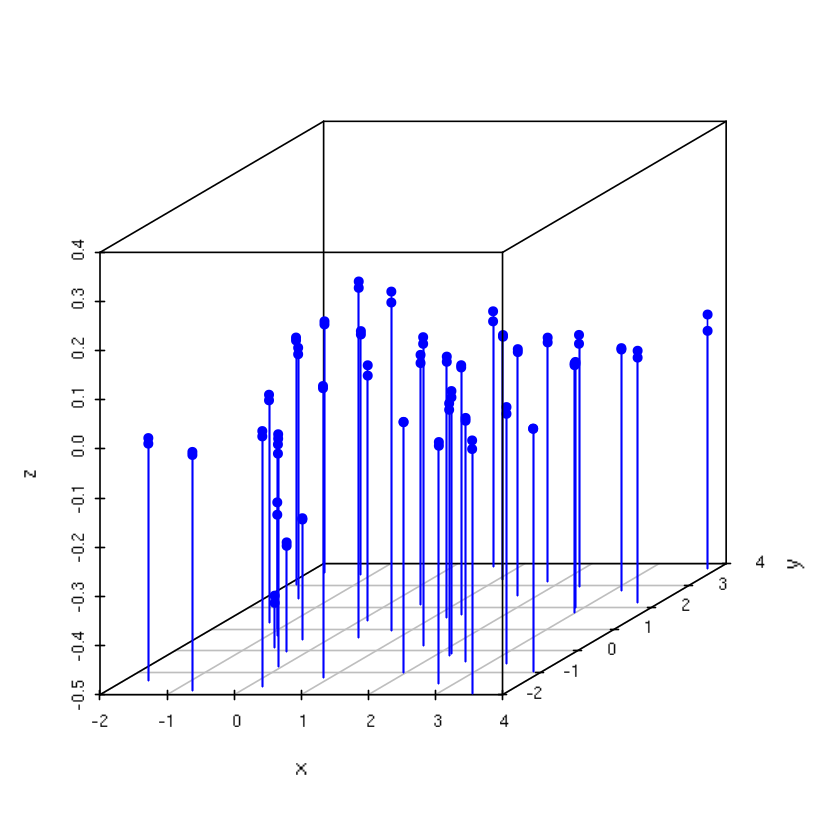

In [507]:
library(scatterplot3d)
xyz <- cbind(X2, y2)
colnames(xyz) <- c("x", "y", "z")
scatterplot3d(xyz, pch=16, type='h', color="blue")

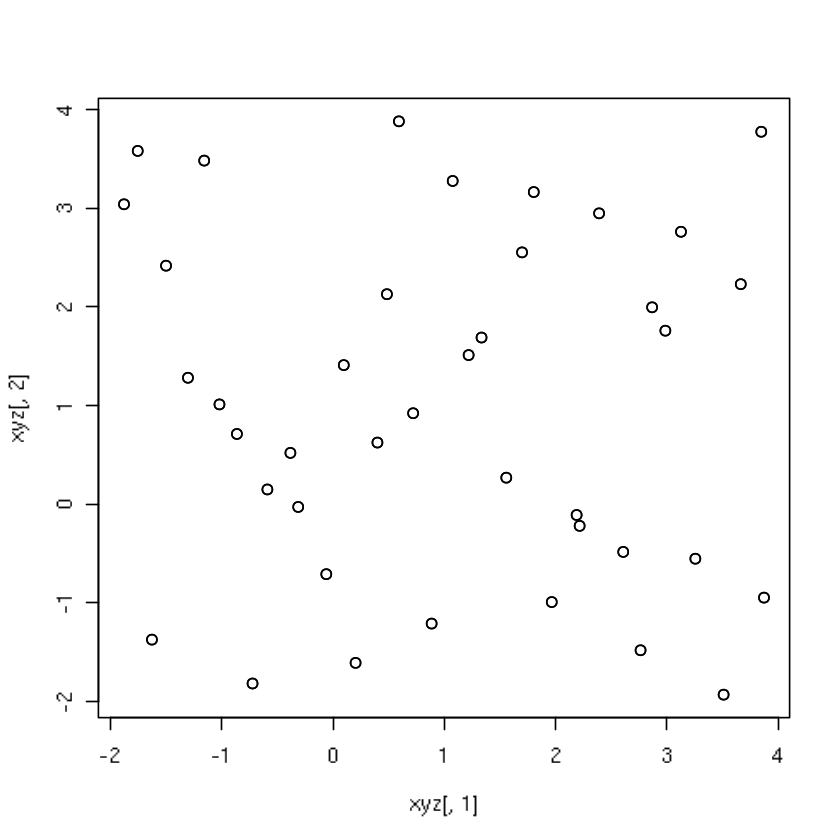

In [508]:
plot(xyz[,1], xyz[,2])

In [509]:
D <- distance(X2)
counter <- 0
out <- optim(c(0.1, 0.1*var(y)), nl, method="L-BFGS-B", 
             lower=eps, upper=c(10, var(y2)), D=D, Y=y2)
out

$par
[1] 0.80371703 0.01076803

$value
[1] -108.2684

$counts
function gradient 
      12       12 

$convergence
[1] 0

$message
[1] "CONVERGENCE: REL_REDUCTION_OF_F <= FACTR*EPSMCH"

In [510]:
brute <- c(out$counts, actual=counter)
brute

function gradient   actual 
      12       12       60

In [511]:
gradnl <- function(par, D, Y)
 {
  ## extract parameters
  theta <- par[1]
  g <- par[2]

  ## calculate covariance quantities from data and parameters
  n <- length(Y)
  K <- exp(-D/theta) + diag(g, n)
  Ki <- solve(K)
  dotK <- K*D/theta^2
  KiY <- Ki %*% Y

  ## theta component
  dlltheta <- (n/2) * t(KiY) %*% dotK %*% KiY / (t(Y) %*% KiY) - 
    (1/2)*sum(diag(Ki %*% dotK))

  ## g component
  dllg <- (n/2) * t(KiY) %*% KiY / (t(Y) %*% KiY) - (1/2)*sum(diag(Ki))
    
  ## combine the components into a gradient vector
  return(-c(dlltheta, dllg))
 }

In [512]:
counter <- 0
outg <- optim(c(0.1, 0.1*var(y2)), nl, gradnl, method="L-BFGS-B", 
  lower=eps, upper=c(10, var(y2)), D=D, Y=y2) 
rbind(grad=outg$par, brute=out$par)

grad,0.8049067,0.01071076
brute,0.8037170,0.01076803


In [513]:
rbind(grad=c(outg$counts, actual=counter), brute)

,function,gradient,actual
grad,13,13,13
brute,12,12,60


In [514]:
K <- exp(-D/outg$par[1]) + diag(outg$par[2], nrow(X2))
Ki <- solve(K)
tau2hat <- drop(t(y2) %*% y2 / nrow(X2))

In [515]:
gn <- 40
xx <- seq(-2, 4, length=gn)
XX <- expand.grid(xx, xx)
DXX <- distance(XX)
KXX <- exp(-DXX/outg$par[1]) + diag(outg$par[2], ncol(DXX))
DX <- distance(XX, X2)
KX <- exp(-DX/out$par[1])

In [516]:
mup <- KX %*% Ki %*% y2
Sigmap <- tau2hat*(KXX - KX %*% Ki %*% t(KX))
sdp <- sqrt(diag(Sigmap))

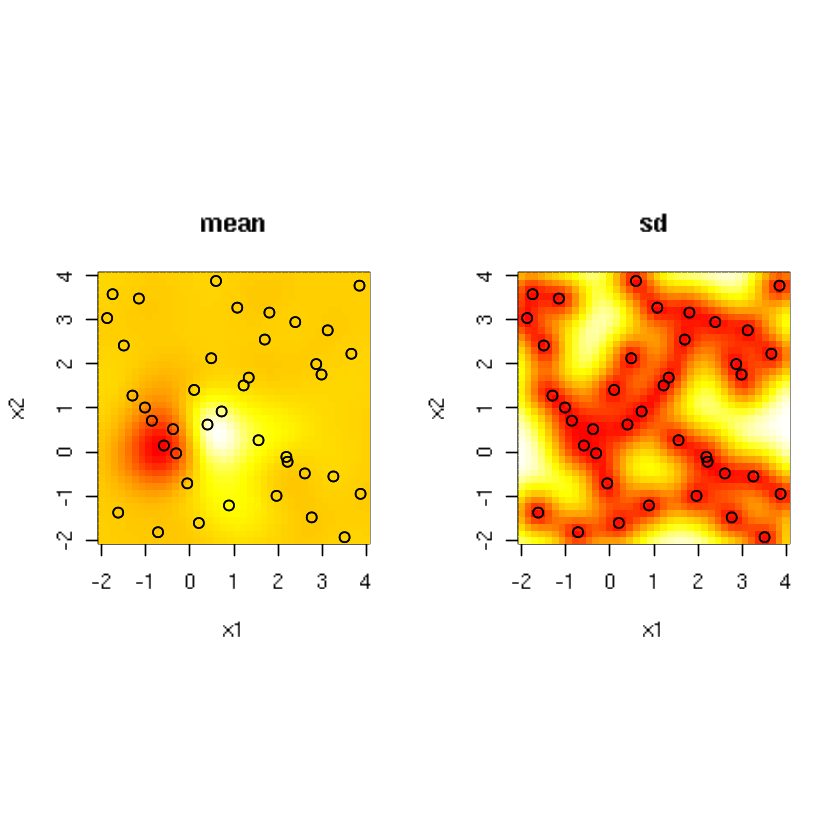

In [517]:
par(mfrow=c(1,2), pty="s")
image(xx, xx, matrix(mup, ncol=gn), main="mean", xlab="x1", ylab="x2", col=cols)
points(X2)
image(xx, xx, matrix(sdp, ncol=gn), main="sd", xlab="x1", ylab="x2", col=cols)
points(X2)

### 5.2.5 Anistropic modeling

In [518]:
fried <- function(n=50, m=6)
 {
  if(m < 5) stop("must have at least 5 cols")
  X <- randomLHS(n, m)
  Ytrue <- 10*sin(pi*X[,1]*X[,2]) + 20*(X[,3] - 0.5)^2 + 10*X[,4] + 5*X[,5]
  Y <- Ytrue + rnorm(n, 0, 1)
  return(data.frame(X, Y, Ytrue))
 }

In [519]:
m <- 7
n <- 200
nprime <- 1000
ntotal <- n + nprime
set.seed(333)
data <- fried(ntotal, m)
X <- as.matrix(data[1:n,1:m])
y <- drop(data$Y[1:n])
XX <- as.matrix(data[(n + 1):(ntotal),1:m])
yy <- drop(data$Y[(n + 1):(ntotal)])
yytrue <- drop(data$Ytrue[(n + 1):(ntotal)])

In [520]:
dim(X)
range(yy)
dim(data)

[1] 200   7

[1]  0.3451383 28.0735626

[1] 1200    9

In [521]:
# isotropic case
D <- distance(X)
# theta0 <- c(0.1)
# g0 <- 0.1*var(y)
out <- optim(c(0.1, 0.1*var(y)), nl, gradnl, method="L-BFGS-B", 
             lower=eps, upper=c(20, var(y)), D=D, Y=y)
out

$par
[1] 2.658988460 0.008365323

$value
[1] 691.9306

$counts
function gradient 
      34       34 

$convergence
[1] 0

$message
[1] "CONVERGENCE: REL_REDUCTION_OF_F <= FACTR*EPSMCH"

In [522]:
K <- exp(- D/out$par[1]) + diag(out$par[2], nrow(D))
Ki <- solve(K)
tau2hat <- drop(t(y) %*% Ki %*% y / nrow(D))

In [523]:
DXX <- distance(XX)
KXX <- exp(-DXX/out$par[1]) + diag(out$par[2], ncol(DXX))
DX <- distance(XX, X)
KX <- exp(-DX/out$par[1])

In [524]:
mup <- KX %*% Ki %*% y
Sigmap <- tau2hat*(KXX - KX %*% Ki %*% t(KX))

In [525]:
rmse <- c(gpiso=sqrt(mean((yytrue - mup)^2)))
rmse

gpiso 
1.121371

In [526]:
library(mda)
fit.mars <- mars(X, y)
p.mars <- predict(fit.mars, XX)

In [527]:
rmse <- c(rmse, mars=sqrt(mean((yytrue - p.mars)^2)))
rmse

gpiso     mars 
1.121371 1.447406

In [528]:
# anisotropic modeling
nlsep <- function(par, X, Y) 
 {
  theta <- par[1:ncol(X)]  
  g <- par[ncol(X)+1]
  n <- length(Y)
  K <- covar.sep(X, d=theta, g=g)  # plgp 패키지의 함수를 이용
  Ki <- solve(K)
  ldetK <- determinant(K, logarithm=TRUE)$modulus
  ll <- - (n/2)*log(t(Y) %*% Ki %*% Y) - (1/2)*ldetK
  counter <<- counter + 1
  return(-ll)
 }

In [529]:
tic <- proc.time()[3]
counter <- 0 
out <- optim(c(rep(0.1, ncol(X)), 0.1*var(y)), nlsep, method="L-BFGS-B", 
  X=X, Y=y, lower=eps, upper=c(rep(10, ncol(X)), var(y)))
toc <- proc.time()[3]
out$par

[1]  0.848986309  1.138612518  1.465636037  8.567414820  9.328160950
[6] 10.000000000  9.695732707  0.009926132

In [530]:
brute <- c(out$counts, actual=counter)
brute

function gradient   actual 
      82       82     1394

In [531]:
toc - tic

elapsed 
  2.714

In [532]:
gradnlsep <- function(par, X, Y)
 {
  theta <- par[1:ncol(X)]
  g <- par[ncol(X)+1]
  n <- length(Y)
  K <- covar.sep(X, d=theta, g=g) 
  Ki <- solve(K)
  KiY <- Ki %*% Y

  ## loop over theta components
  dlltheta <- rep(NA, length(theta))
  for(k in 1:length(dlltheta)) {
    dotK <- K * distance(X[,k])/(theta[k]^2)
    dlltheta[k] <- (n/2) * t(KiY) %*% dotK %*% KiY / (t(Y) %*% KiY) - 
      (1/2)*sum(diag(Ki %*% dotK))
  }

  ## for g   
  dllg <- (n/2) * t(KiY) %*% KiY / (t(Y) %*% KiY) - (1/2)*sum(diag(Ki))
    
  return(-c(dlltheta, dllg))
 }

In [533]:
tic <- proc.time()[3]
counter <- 0
outg <- optim(c(rep(0.1, ncol(X)), 0.1*var(y)), nlsep, gradnlsep,
              method="L-BFGS-B", 
              lower=eps, 
              upper=c(rep(10, ncol(X)), var(y)), 
              X=X, Y=y)
toc <- proc.time()[3]
thetahat <- rbind(grad=outg$par, brute=out$par)
colnames(thetahat) <- c(paste0("d", 1:ncol(X)), "g")
thetahat

,d1,d2,d3,d4,d5,d6,d7,g
grad,0.7887148,1.146277,1.337203,7.612222,9.225465,10,10.000000,0.010600334
brute,0.8489863,1.138613,1.465636,8.567415,9.328161,10,9.695733,0.009926132


In [534]:
rbind(grad=c(outg$counts, actual=counter), brute)

,function,gradient,actual
grad,130,130,130
brute,82,82,1394


In [535]:
toc - tic

elapsed 
  1.067

In [536]:
K <- covar.sep(X, d=outg$par[1:ncol(X)], g=outg$par[ncol(X)+1])
Ki <- solve(K)
tau2hat <- drop(t(y) %*% Ki %*% y / nrow(X))
KXX <- covar.sep(XX, d=outg$par[1:ncol(X)], g=outg$par[ncol(X)+1]) 
KX <- covar.sep(XX, X, d=outg$par[1:ncol(X)], g=0)
mup2 <- KX %*% Ki %*% y
Sigmap2 <- tau2hat*(KXX - KX %*% Ki %*% t(KX))

In [537]:
rmse <- c(rmse, gpsep=sqrt(mean((yytrue - mup2)^2)))
rmse

gpiso      mars     gpsep 
1.1213711 1.4474055 0.6824247

In [538]:
scores <- c(gp=score(yy, mup, Sigmap), mars=NA, 
  gpsep=score(yy, mup2, Sigmap2))
scores

gp      mars     gpsep 
-1376.615        NA -1148.798

### 5.2.6 Library

In [539]:
library(laGP)

In [540]:
tic <- proc.time()[3]
gpi <- newGPsep(X, y, d=0.1, g=0.1*var(y), dK=TRUE)  # d, g는 초기값, dK는 mle에 필요
mle <- mleGPsep(gpi, param="both", tmin=c(eps, eps), tmax=c(10, var(y)))
       # tmin=theta_min, tax=theta_max
toc <- proc.time()[3]

In [541]:
thetahat <- rbind(grad=outg$par, brute=out$par, laGP=mle$theta)
colnames(thetahat) <- c(paste0("d", 1:ncol(X)), "g")
thetahat

,d1,d2,d3,d4,d5,d6,d7,g
grad,0.7887148,1.146277,1.337203,7.612222,9.225465,10,10.000000,0.010600334
brute,0.8489863,1.138613,1.465636,8.567415,9.328161,10,9.695733,0.009926132
laGP,0.8337904,1.013595,1.184149,7.826683,9.656237,10,10.000000,0.011126492


In [542]:
mle

$theta
[1]  0.83379037  1.01359514  1.18414948  7.82668287  9.65623708 10.00000000
[7] 10.00000000  0.01112649

$its
[1] 131

$msg
[1] "NEW_X"

$conv
[1] 1

In [543]:
toc - tic

elapsed 
  0.222

In [544]:
rbind(grad=c(outg$counts, actual=counter), brute, laGP=c(mle$its, mle$its, NA))

,function,gradient,actual
grad,130,130,130
brute,82,82,1394
laGP,131,131,NA


In [545]:
p <- predGPsep(gpi, XX)

In [546]:
rmse <- c(rmse, laGP=sqrt(mean((yytrue - p$mean)^2)))
scores <- c(scores, laGP=score(yy, p$mean, p$Sigma))
rbind(rmse, scores)

,gpiso,mars,gpsep,laGP
rmse,1.121371,1.447406,0.6824247,0.686916
scores,-1376.614848,NA,-1148.7984300,-1149.119265


In [547]:
deleteGPsep(gpi)

### 5.2.7 A bakeoff

In [548]:
R <- 30
scores <- rmses <- times <- matrix(NA, nrow=R, ncol=4)
colnames(scores) <- colnames(rmses) <- colnames(times) <- names(rmse)

In [549]:
for(r in 1:R) {

  ## train-test partition and application of f(x) on both
  data <- fried(2*n, m)
  train <- data[1:n,]
  test <- data[(n + 1):(2*n),]
    
  ## extract data elements from both train and test
  X <- as.matrix(train[,1:m])
  y <- drop(train$Y)
  XX <- as.matrix(test[,1:m])
  yy <- drop(test$Y)            ## for score
  yytrue <- drop(test$Ytrue)    ## for RMSE

  ## isotropic GP fit and predict by hand
  tic <- proc.time()[3]
  D <- distance(X)
  out <- optim(c(0.1, 0.1*var(y)), nl, gradnl, method="L-BFGS-B", 
    lower=eps, upper=c(10, var(y)), D=D, Y=y)
  K <- exp(-D/out$par[1]) + diag(out$par[2], nrow(D))
  Ki <- solve(K)
  tau2hat <- drop(t(y) %*% Ki %*% y / nrow(D))
  DXX <- distance(XX)
  KXX <- exp(-DXX/out$par[1]) + diag(out$par[2], ncol(DXX))
  DX <- distance(XX, X)
  KX <- exp(-DX/out$par[1])
  mup <- KX %*% Ki %*% y
  Sigmap <- tau2hat*(KXX - KX %*% Ki %*% t(KX))
  toc <- proc.time()[3]

  ## calculation of metrics for GP by hand
  rmses[r,1] <- sqrt(mean((yytrue - mup)^2))
  scores[r,1] <- score(yy, mup, Sigmap)
  times[r,1] <- toc - tic

  ## MARS fit, predict, and RMSE calculation (no score)
  tic <- proc.time()[3]
  fit.mars <- mars(X, y)
  p.mars <- predict(fit.mars, XX)
  toc <- proc.time()[3]
  rmses[r,2] <- sqrt(mean((yytrue - p.mars)^2))
  times[r,2] <- toc - tic

  ## separable GP fit and predict by hand
  tic <- proc.time()[3]
  outg <- optim(c(rep(0.1, ncol(X)), 0.1*var(y)), nlsep, gradnlsep, 
    method="L-BFGS-B", lower=eps, upper=c(rep(10, m), var(y)), X=X, Y=y)
  K <- covar.sep(X, d=outg$par[1:m], g=outg$par[m+1])
  Ki <- solve(K)
  tau2hat <- drop(t(y) %*% Ki %*% y / nrow(X))
  KXX <- covar.sep(XX, d=outg$par[1:m], g=outg$par[m+1])
  KX <- covar.sep(XX, X, d=outg$par[1:m], g=0)
  mup2 <- KX %*% Ki %*% y
  Sigmap2 <- tau2hat*(KXX - KX %*% Ki %*% t(KX))
  toc <- proc.time()[3]

  ## calculation of metrics for separable GP by hand
  rmses[r,3] <- sqrt(mean((yytrue - mup2)^2))
  scores[r,3] <- score(yy, mup2, Sigmap2)
  times[r,3] <- toc - tic

  ## laGP based separable GP
  tic <- proc.time()[3]
  gpi <- newGPsep(X, y, d=0.1, g=0.1*var(y), dK=TRUE)
  mle <- mleGPsep(gpi, param="both", tmin=c(eps, eps), tmax=c(10, var(y)))
  p <- predGPsep(gpi, XX)
  deleteGPsep(gpi)
  toc <- proc.time()[3]

  ## calculation of metrics for laGP based separable GP
  rmses[r,4] <- sqrt(mean((yytrue - p$mean)^2))
  scores[r,4] <- score(yy, p$mean, p$Sigma)
  times[r,4] <- toc - tic
}

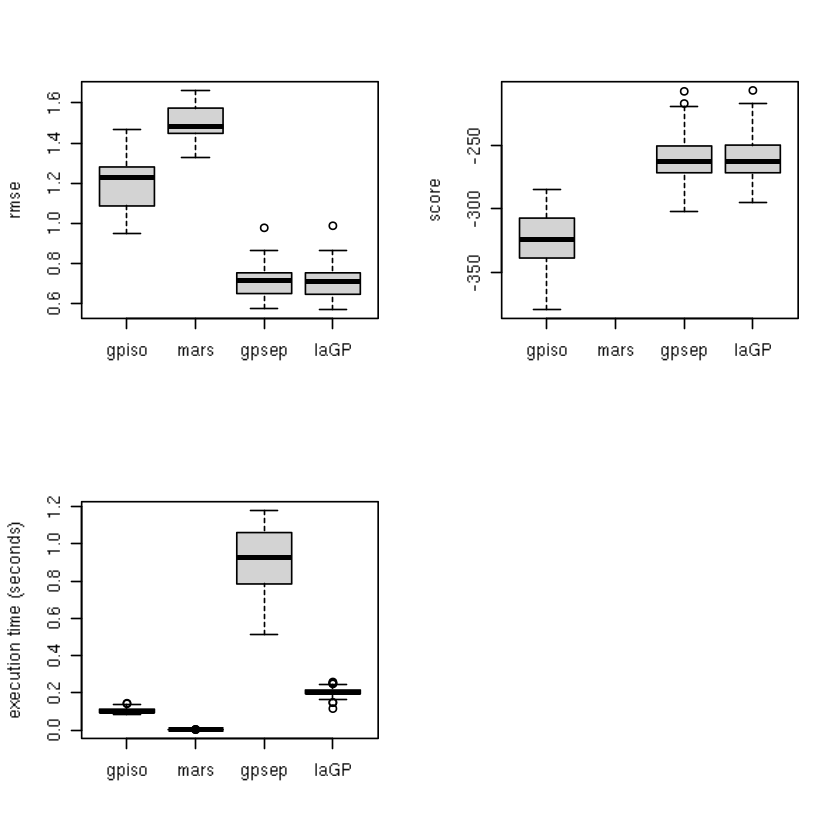

In [550]:
par(mfrow=c(2,2))
boxplot(rmses, ylab="rmse")
boxplot(scores, ylab="score")
boxplot(times, ylab="execution time (seconds)")

In [552]:
t.test(scores[,4], scores[,3], paired=TRUE)


	Paired t-test

data:  scores[, 4] and scores[, 3]
t = 1.6208, df = 29, p-value = 0.1159
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.1071322  0.9253582
sample estimates:
mean of the differences 
               0.409113 


### 5.3.3 Stationary kernels

In [553]:
matern <- function(r, nu, theta) {
  rat <- r*sqrt(2*nu/theta)
  C <- (2^(1 - nu))/gamma(nu) * rat^nu * besselK(rat, nu)
  C[is.nan(C)] <- 1
  return(C)
}

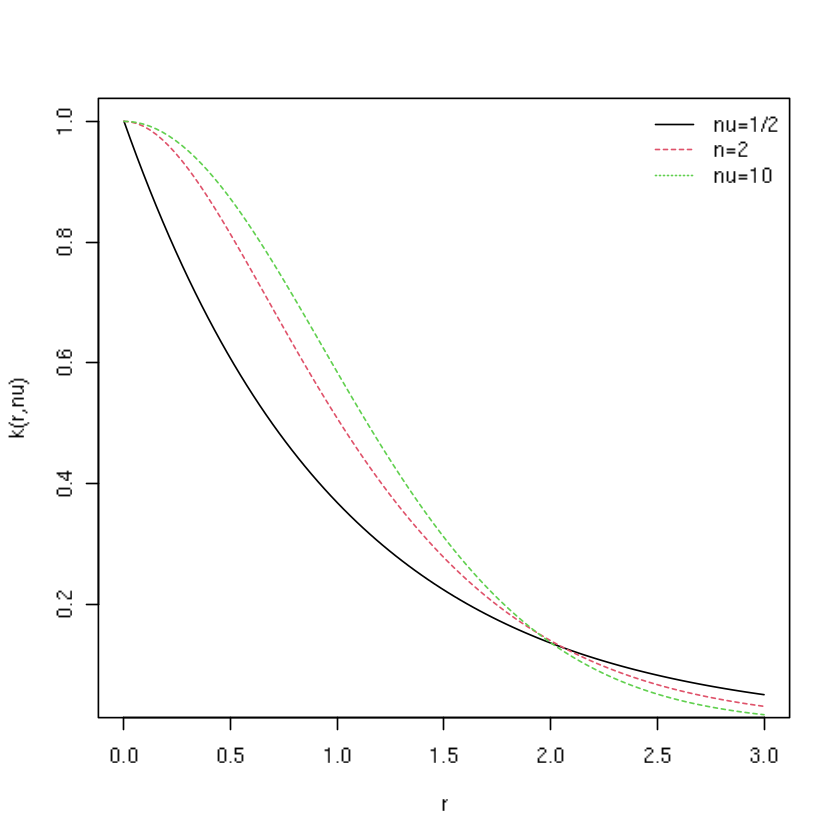

In [554]:
r <- seq(eps, 3, length=100)
plot(r, matern(r, nu=1/2, theta=1), type="l", ylab="k(r,nu)")
lines(r, matern(r, nu=2, theta=1), lty=2, col=2)
lines(r, matern(r, nu=10, theta=1), lty=2, col=3)
legend("topright", c("nu=1/2", "n=2", "nu=10"), lty=1:3, col=1:3, bty="n")

In [555]:
X <- seq(0, 10, length=100)
R <- sqrt(distance(X))
K0.5 <- matern(R, nu=1/2, theta=1)
K2 <- matern(R, nu=2, theta=1)
K10 <- matern(R, nu=10, theta=1)

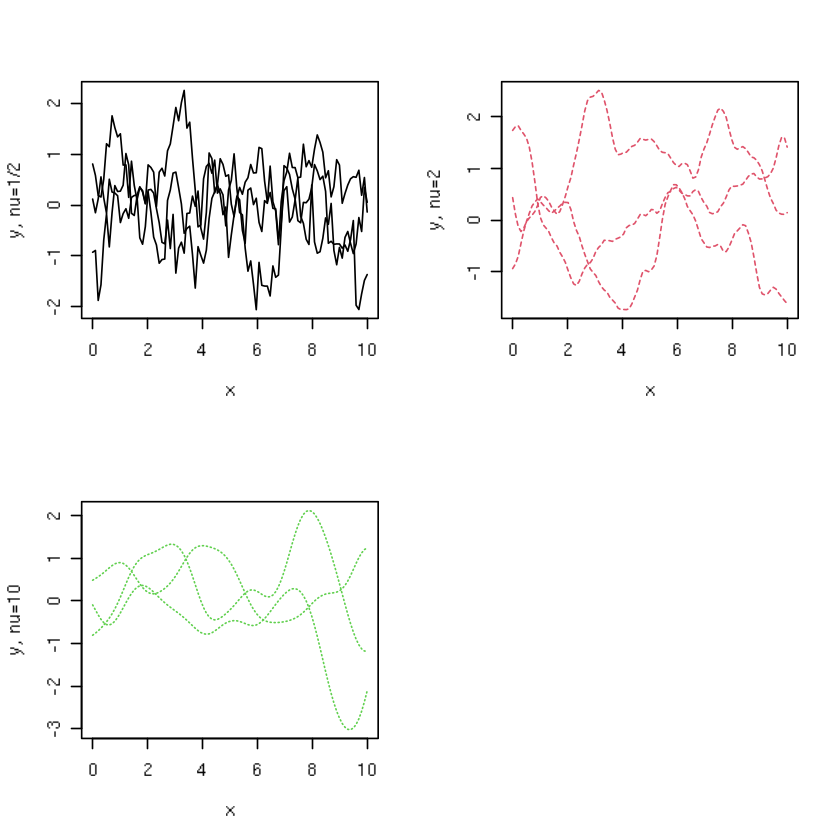

In [556]:
par(mfrow=c(2, 2))
matplot(X, t(rmvnorm(3, sigma=K0.5)), type="l", col=1, lty=1, 
        xlab="x", ylab="y, nu=1/2")
matplot(X, t(rmvnorm(3, sigma=K2)), type="l", col=2, lty=2, 
        xlab="x", ylab="y, nu=2")
matplot(X, t(rmvnorm(3, sigma=K10)), type="l", col=3, lty=3, 
        xlab="x", ylab="y, nu=10")

In [565]:
F <- rmvnorm(1, sigma=K2)
dF <- (F[-1] - F[-length(F)])/(X[2] - X[1])
d2F <- (dF[-1] - dF[-length(dF)])/(X[2] - X[1])

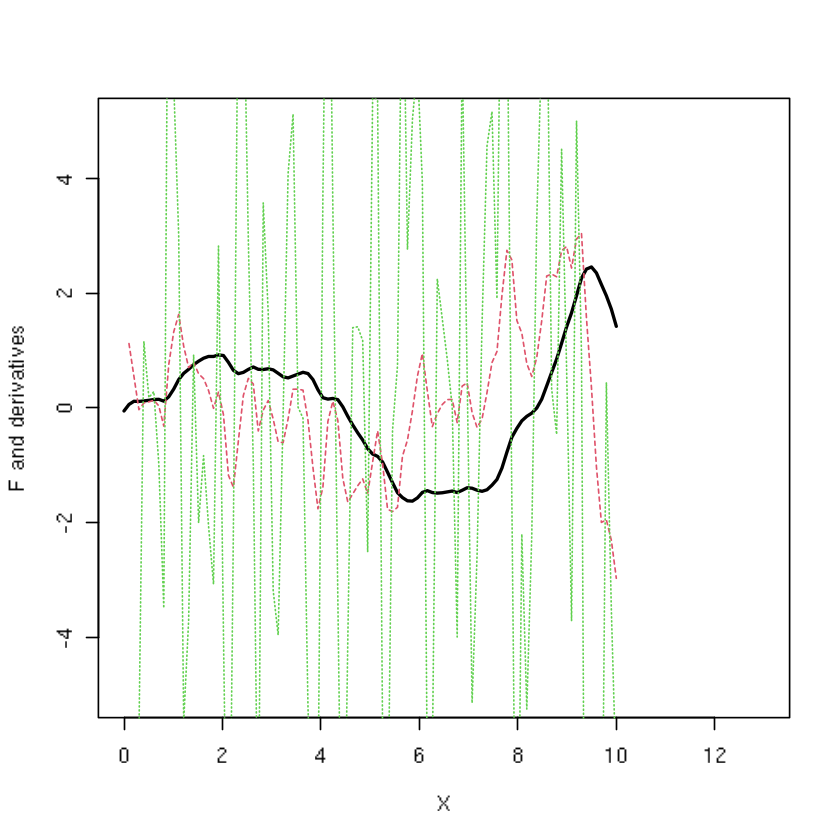

In [566]:
plot(X, F, type="l", lwd=2, xlim=c(0,13), ylim=c(-5,5), 
     ylab="F and derivatives")
lines(X[-1], dF, col=2, lty=2)
lines(X[-(1:2)], d2F, col=3, lty=3)

In [567]:
powerexp <- function(r, alpha, theta) 
 {
  C <- exp(-(r/sqrt(theta))^alpha)
  C[is.nan(C)] <- 1
  return(C)
 }

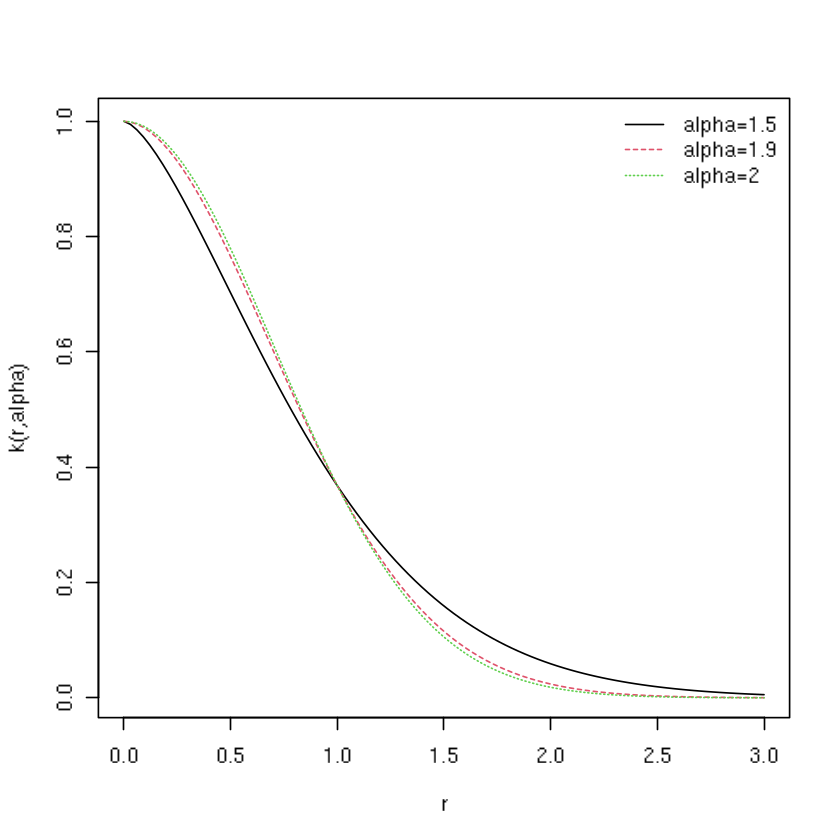

In [571]:
plot(r, powerexp(r, alpha=1.5, theta=1), type="l", ylab="k(r,alpha)")
lines(r, powerexp(r, alpha=1.9, theta=1), lty=2, col=2)
lines(r, powerexp(r, alpha=2, theta=1), lty=3, col=3)
legend("topright", c("alpha=1.5", "alpha=1.9", "alpha=2"), 
  lty=1:3, col=1:3, bty="n")

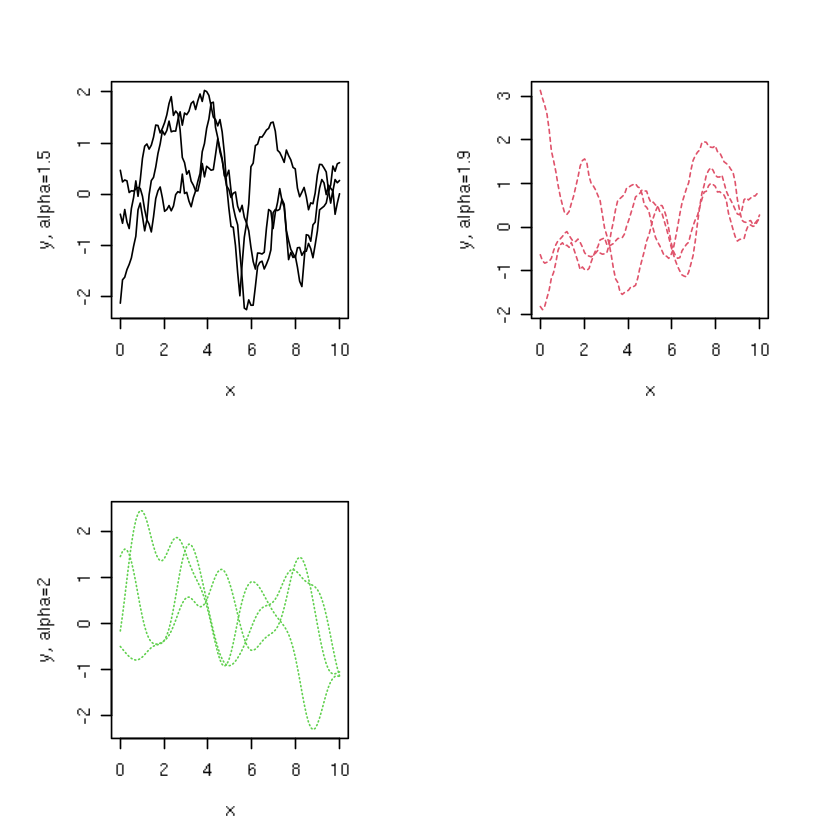

In [576]:
Ka1.5 <- powerexp(R, alpha=1.5, theta=1)
Ka1.9 <- powerexp(R, alpha=1.9, theta=1)
Ka2 <- powerexp(R, alpha=2, theta=1) + diag(eps, nrow(R))
par(mfrow=c(2, 2), pty="s")
ylab <- paste0("y, alpha=", c(1.5, 1.9, 2))
matplot(X, t(rmvnorm(3, sigma=Ka1.5)), type="l", col=1, lty=1, 
  xlab="x", ylab=ylab[1])
matplot(X, t(rmvnorm(3, sigma=Ka1.9)), type="l", col=2, lty=2, 
  xlab="x", ylab=ylab[2])
matplot(X, t(rmvnorm(3, sigma=Ka2)), type="l", col=3, lty=3, 
  xlab="x", ylab=ylab[3])

In [577]:
ratquad <- function(r, alpha, theta) 
 {
  C <- (1 + r^2/(2 * alpha * theta))^(-alpha)
  C[is.nan(C)] <- 1
  return(C)
 }

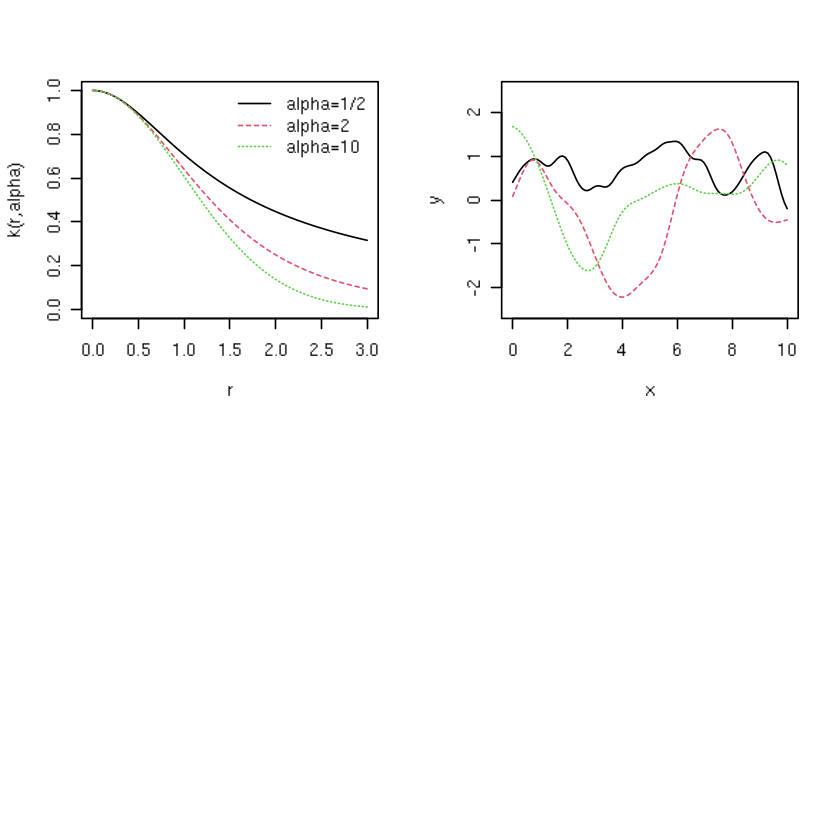

In [605]:
par(mfrow=c(2,2))
set.seed(1)
plot(r, ratquad(r, alpha=1/2, theta=1), type="l", 
  ylab="k(r,alpha)", ylim=c(0,1))
lines(r, ratquad(r, alpha=2, theta=1), lty=2, col=2)
lines(r, ratquad(r, alpha=100, theta=1), lty=3, col=3)
legend("topright", c("alpha=1/2", "alpha=2", "alpha=10"), lty=1:3, 
  col=1:3, bty="n")
plot(X, rmvnorm(1, sigma=ratquad(R, alpha=1/2, theta=1)), type="l", col=1, 
  lty=1, xlab="x", ylab="y", ylim=c(-2.5,2.5))
lines(X, rmvnorm(1, sigma=ratquad(R, alpha=2, theta=1)), col=2, lty=2)
lines(X, rmvnorm(1, sigma=ratquad(R, alpha=10, theta=1)), type="l", 
  col=3, lty=3)

### 5.3.4 Signal-to-noise

In [606]:
x <- seq(0, 10, length=40)
ytrue <- (sin(pi*x/5) + 0.2*cos(4*pi*x/5))
y <- ytrue + rnorm(length(ytrue), sd=0.2)

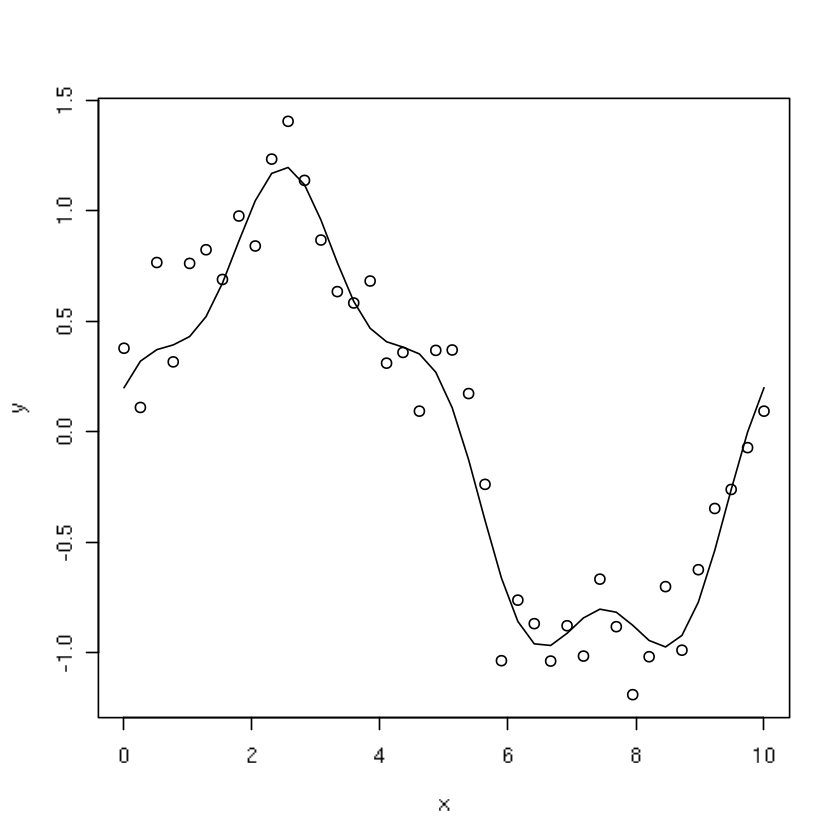

In [607]:
plot(x, y)
lines(x, ytrue)

In [608]:
g <- seq(0.001, 0.4, length=100)
theta <- seq(0.1, 4, length=100)
grid <- expand.grid(theta, g)

In [609]:
ll <- rep(NA, nrow(grid))
xx <- seq(0, 10, length=100)
pm <- matrix(NA, nrow=nrow(grid), ncol=length(xx))
psd <- matrix(NA, nrow=nrow(grid), ncol=length(xx))
for(i in 1:nrow(grid)) {
  gpi <- newGP(matrix(x, ncol=1), y, d=grid[i,1], g=grid[i,2])
  p <- predGP(gpi, matrix(xx, ncol=1), lite=TRUE)
  pm[i,] <- p$mean
  psd[i,] <- sqrt(p$s2)
  ll[i] <- llikGP(gpi)
  deleteGP(gpi)
}
l <- exp(ll - max(ll))

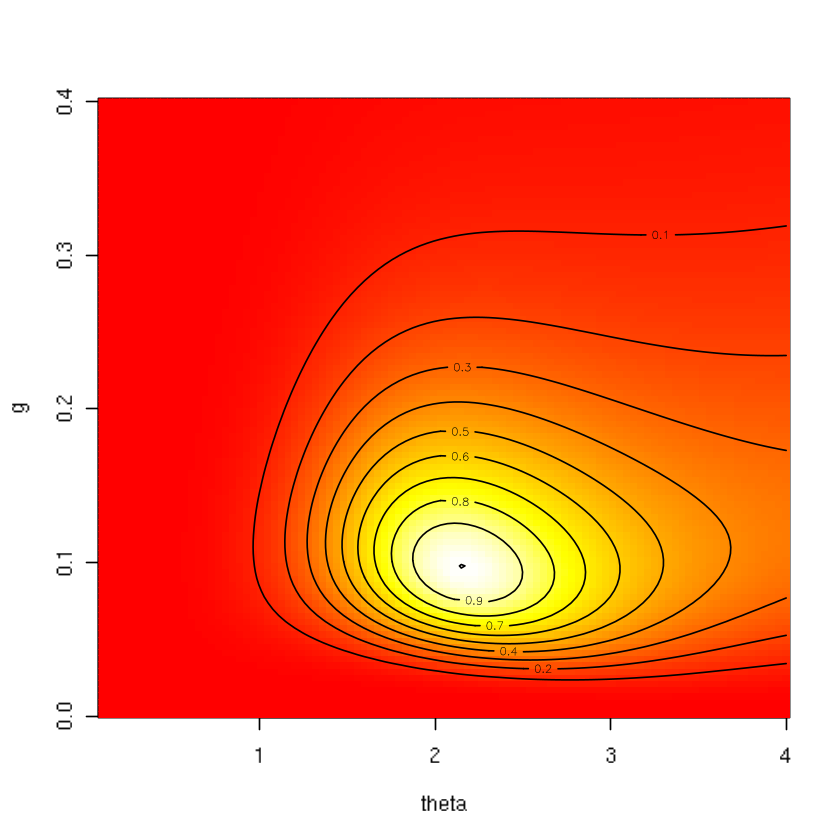

In [610]:
image(theta, g, matrix(l, ncol=length(theta)), col=cols)
contour(theta, g, matrix(l, ncol=length(g)), add=TRUE)

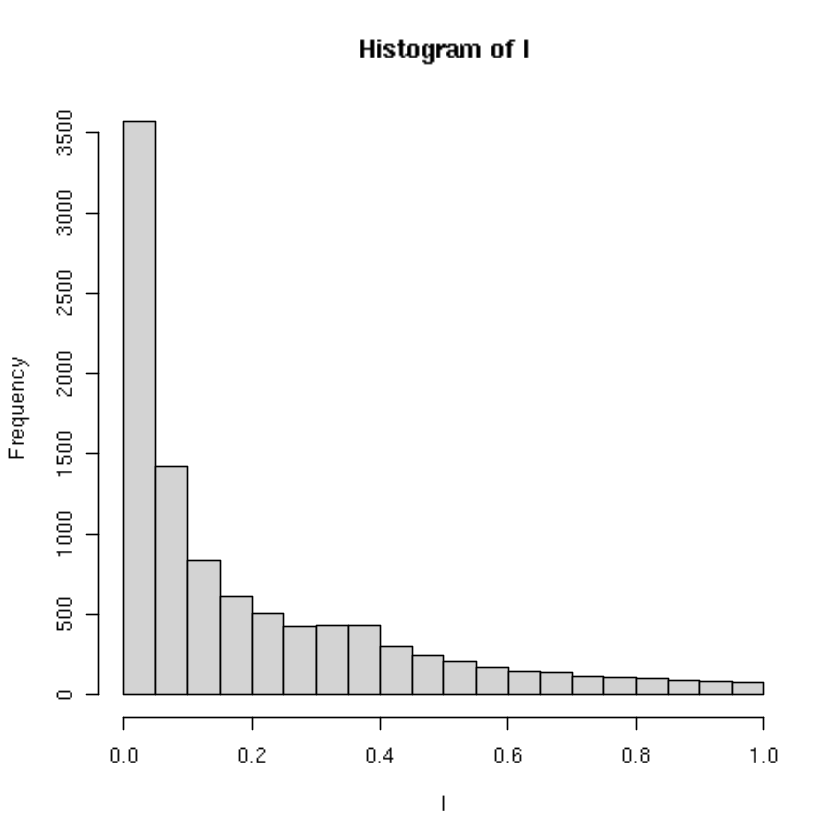

In [614]:
hist(l)

In [615]:
q1 <- pm + qnorm(0.95, sd=psd)
q2 <- pm + qnorm(0.05, sd=psd)

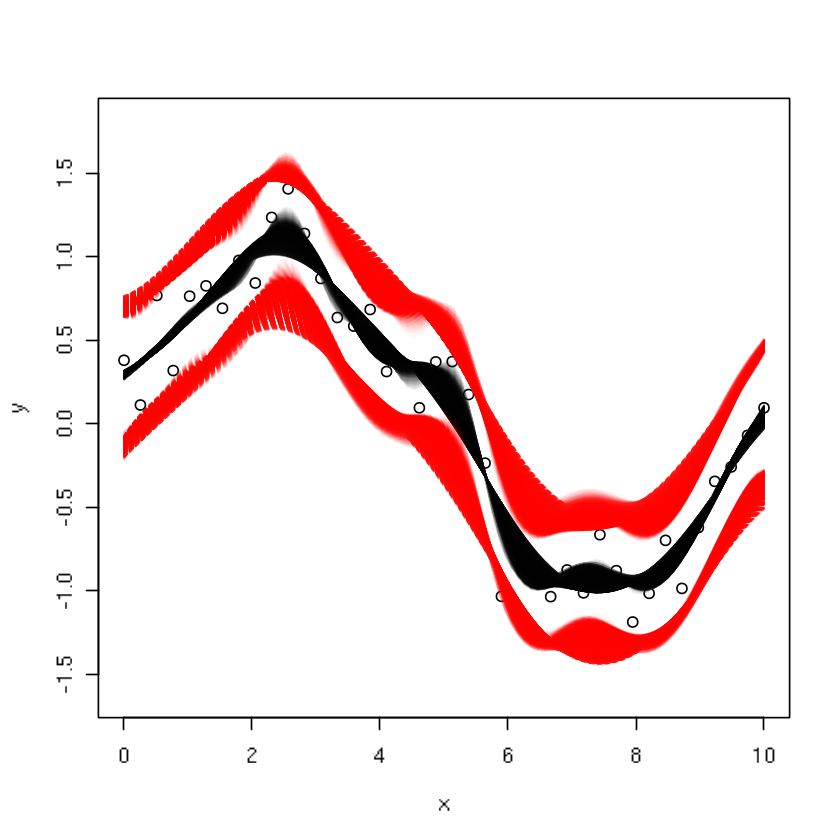

In [616]:
plot(x,y, ylim=c(range(q1, q2)))
matlines(xx, t(pm), col=rgb(0,0,0,alpha=(l/max(l))/2), lty=1)
matlines(xx, t(q1), col=rgb(1,0,0,alpha=(l/max(l))/2), lty=2)
matlines(xx, t(q2), col=rgb(1,0,0,alpha=(l/max(l))/2), lty=2)

### 5.4.1 GP by convolution

In [617]:
ell <- 10
n <- 100
X <- seq(0, 10, length=n)
omega <- seq(-1, 11, length=ell)
K <- matrix(NA, nrow=n, ncol=ell)
for(j in 1:ell) K[,j] <- dnorm(X, omega[j])

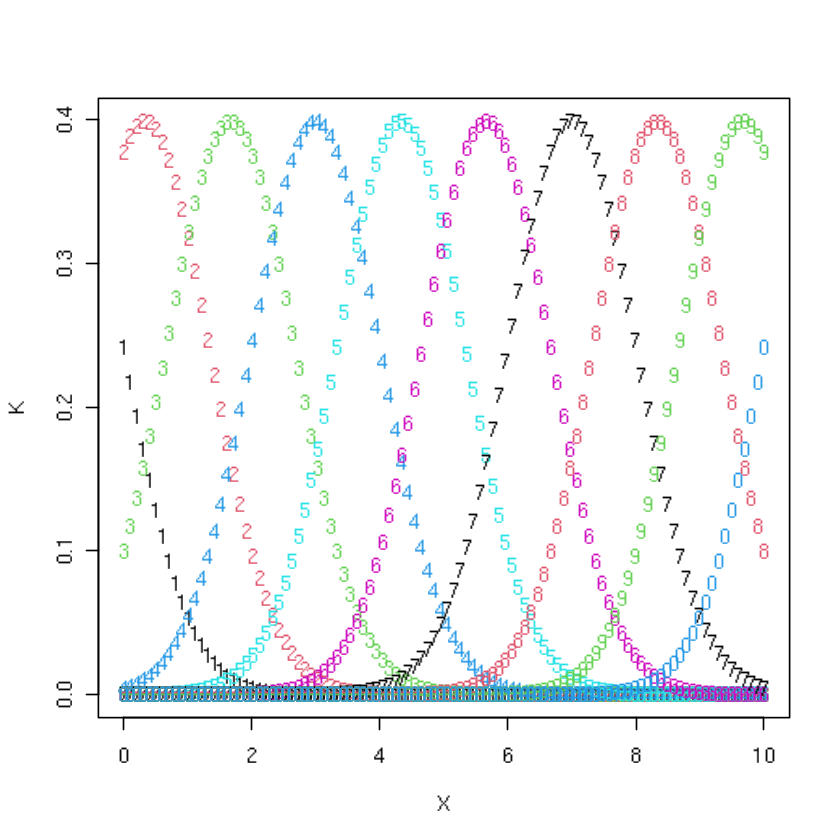

In [618]:
matplot(X, K)

In [619]:
beta <- matrix(rnorm(3*ell), ncol=3)
beta

0.7395892,1.4738812,-2.5923277
-1.0634574,0.6772685,1.3140022
0.2462108,0.3799627,-0.6355430
-0.2894994,-0.1927984,-0.4299788
-2.2648894,1.5778918,-0.1693183
-1.4088505,0.5962341,0.6122182
0.9160193,-1.1735769,0.6783402
-0.1912790,-0.1556425,0.5679520
0.8032832,-1.9189098,-0.5725426
1.8874745,-0.1952588,-1.3632913


In [620]:
F <- K %*% beta

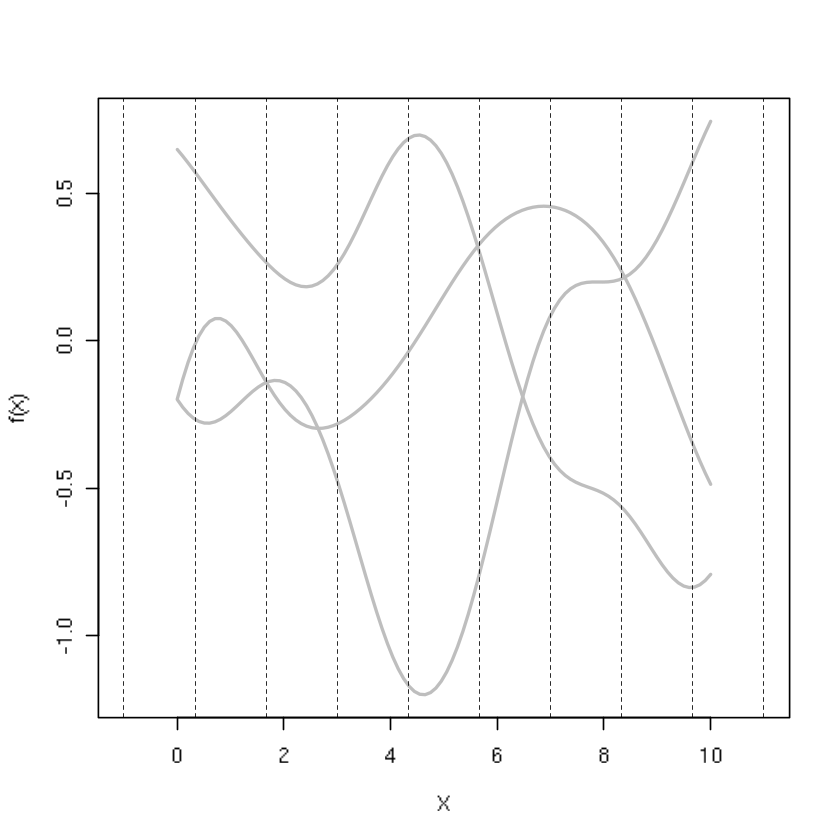

In [621]:
matplot(X, F, type="l", lwd=2, lty=1, col="gray",
       xlim=c(-1,11), ylab="f(x)")
abline(v=omega, lty=2, lwd=0.5)

In [622]:
n <- length(x)
K <- as.data.frame(matrix(NA, ncol=ell, nrow=n))
for(j in 1:ell) K[,j] <- dnorm(x, omega[j])
names(K) <- paste0("omega", 1:ell)
head(K)

,omega1,omega2,omega3,omega4,omega5,omega6,omega7,omega8,omega9,omega10
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.24197072,0.3773832,0.09947714,0.004431848,3.337086e-05,4.246889e-08,9.134720e-12,3.320783e-16,2.040360e-21,2.118819e-27
2,0.18118768,0.3977637,0.14758513,0.009255097,9.809350e-05,1.757197e-07,5.320122e-11,2.722348e-15,2.354434e-20,3.441521e-26
3,0.12704023,0.3925677,0.20502589,0.018097718,2.699976e-04,6.807957e-07,2.901313e-10,2.089746e-14,2.543977e-19,5.234242e-25
4,0.08340665,0.3627861,0.26669913,0.033137019,6.958670e-04,2.469789e-06,1.481544e-09,1.502070e-13,2.573869e-18,7.454249e-24
5,0.05127514,0.3139305,0.32484879,0.056813278,1.679343e-03,8.389765e-06,7.084043e-09,1.010959e-12,2.438410e-17,9.940329e-23
6,0.02951615,0.2543685,0.37049956,0.091208021,3.794891e-03,2.668618e-05,3.171718e-08,6.371235e-12,2.163085e-16,1.241208e-21


In [623]:
fit <- lm(y ~ . -1, data=K)
summary(fit)


Call:
lm(formula = y ~ . - 1, data = K)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.56182 -0.14429  0.01538  0.12843  0.37747 

Coefficients:
        Estimate Std. Error t value Pr(>|t|)   
omega1    1.6783     2.3159   0.725  0.47425   
omega2   -0.7301     1.3264  -0.550  0.58607   
omega3    2.1701     0.9029   2.403  0.02263 * 
omega4    1.2339     0.7460   1.654  0.10854   
omega5    0.5908     0.6932   0.852  0.40081   
omega6   -0.1793     0.6932  -0.259  0.79767   
omega7   -2.1324     0.7460  -2.858  0.00767 **
omega8   -0.8118     0.9029  -0.899  0.37575   
omega9   -1.2796     1.3264  -0.965  0.34240   
omega10   3.0561     2.3159   1.320  0.19695   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2337 on 30 degrees of freedom
Multiple R-squared:  0.9275,	Adjusted R-squared:  0.9033 
F-statistic: 38.36 on 10 and 30 DF,  p-value: 2.363e-14


In [624]:
xx <- seq(-1, 11, length=100)
KK <- as.data.frame(matrix(NA, ncol=ell, nrow=length(xx)))
for(j in 1:ell) KK[,j] <- dnorm(xx, omega[j])
names(KK) <- paste0("omega", 1:ell)

In [625]:
p <- predict(fit, newdata=KK, interval="prediction")

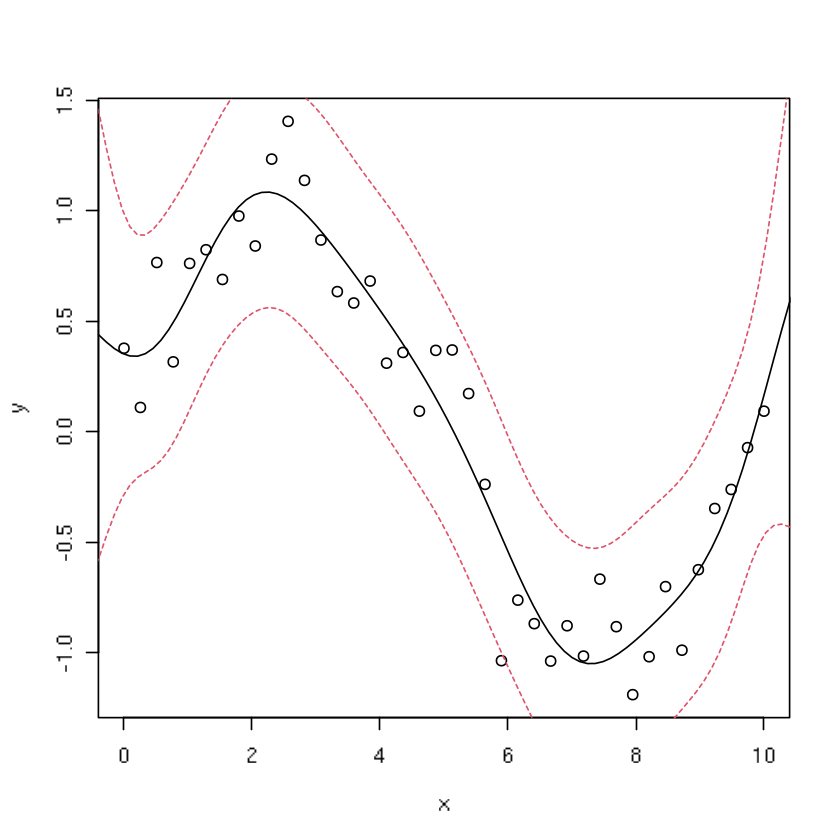

In [626]:
plot(x, y)
lines(xx, p[,1])
lines(xx, p[,2], col=2, lty=2)
lines(xx, p[,3], col=2, lty=2)

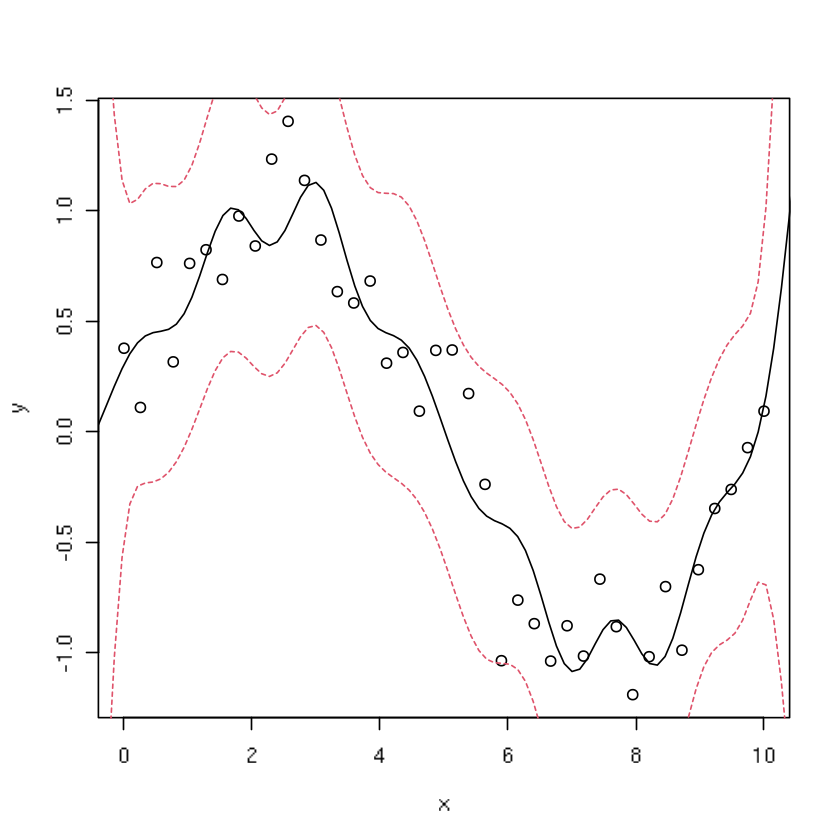

In [635]:
for(j in 1:ell) K[,j] <- dnorm(x, omega[j], sd=0.5) 
fit <- lm(y ~ . -1, data=K)
for(j in 1:ell) KK[,j] <- dnorm(xx, omega[j], sd=0.5) 
p <- predict(fit, newdata=KK, interval="prediction")
plot(x, y)
lines(xx, p[,1])
lines(xx, p[,2], col=2, lty=2)
lines(xx, p[,3], col=2, lty=2)

In [636]:
ell <- 20
omega <- maximinLHS(ell, 2)
omega[,1] <- (omega[,1] - 0.5)*6 + 1
omega[,2] <- (omega[,2] - 0.5)*6 + 1

In [637]:
n <- nrow(X2)
K <- as.data.frame(matrix(NA, ncol=ell, nrow=n))
for(j in 1:ell) 
  K[,j] <- dnorm(X2[,1], omega[j,1])*dnorm(X2[,2], omega[j,2])
names(K) <- paste0("omega", 1:ell)

In [638]:
fit <- lm(y2 ~ . -1, data=K)

In [639]:
xx <- seq(-2, 4, length=gn)
XX <- expand.grid(xx, xx)
KK <- as.data.frame(matrix(NA, ncol=ell, nrow=nrow(XX)))
for(j in 1:ell) 
  KK[,j] <- dnorm(XX[,1], omega[j,1])*dnorm(XX[,2], omega[j,2])
names(KK) <- paste0("omega", 1:ell)

In [640]:
p <- predict(fit, newdata=KK, se.fit=TRUE)

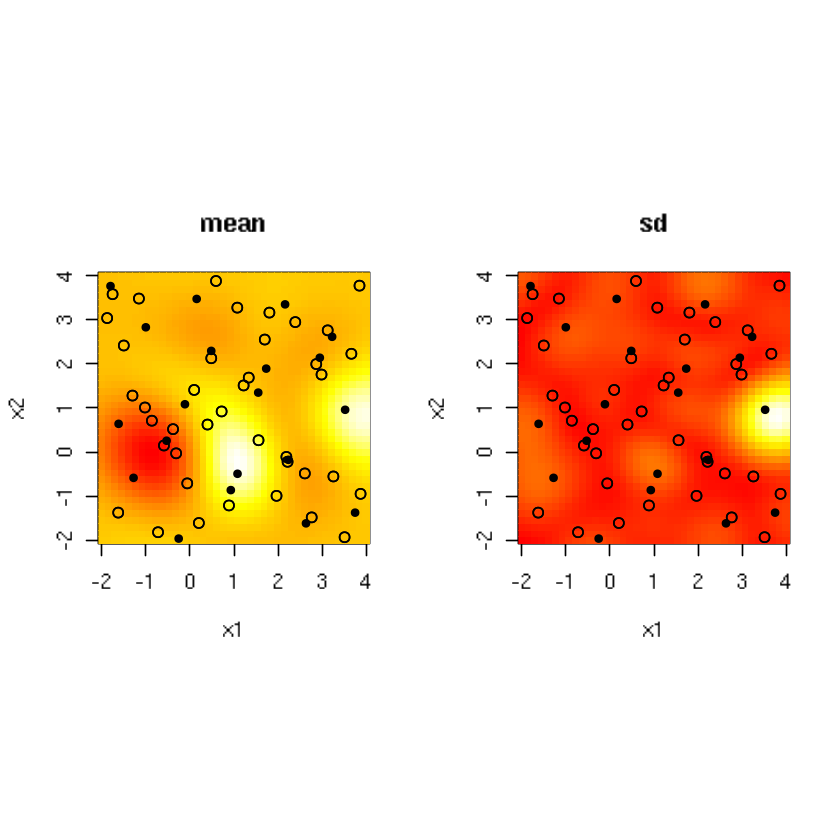

In [641]:
par(mfrow=c(1,2), pty="s")
image(xx, xx, matrix(p$fit, ncol=gn), col=cols, main="mean", 
  xlab="x1", ylab="x2")
points(X2)
points(omega, pch=20)
image(xx, xx, matrix(p$se.fit, ncol=gn), col=cols, main="sd", 
  xlab="x1", ylab="x2")
points(X2)
points(omega, pch=20)

### 5.4.2 Limits of stationarity

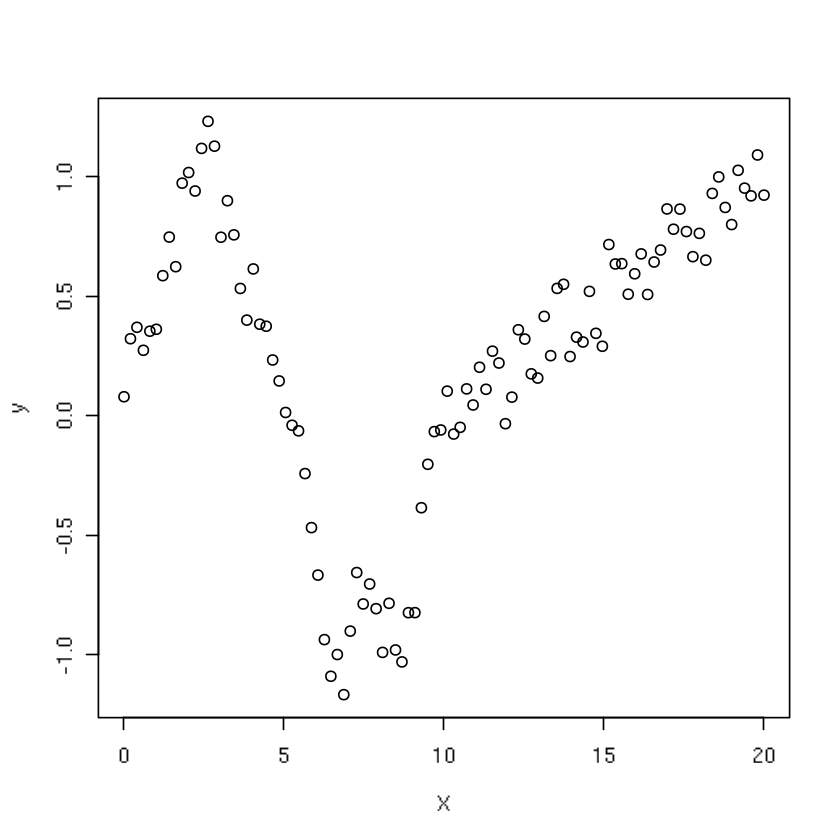

In [656]:
X <- seq(0, 20, length=100)
y <- (sin(pi*X/5) + 0.2*cos(4*pi*X/5)) * (X <= 9.6)
lin <- X > 9.6
y[lin] <- -1 + X[lin]/10
y <- y + rnorm(length(y), sd=0.1)
plot(X, y)

In [657]:
gpi <- newGP(matrix(X), y, d=0.1, g=0.1*var(y), dK=TRUE)
mle <- jmleGP(gpi)
mle

d,g,tot.its,dits,gits
<dbl>,<dbl>,<int>,<int>,<int>
1.84643,0.04087066,28,16,12


In [658]:
p <- predGP(gpi, matrix(X, ncol=1), lite=TRUE)
deleteGP(gpi)

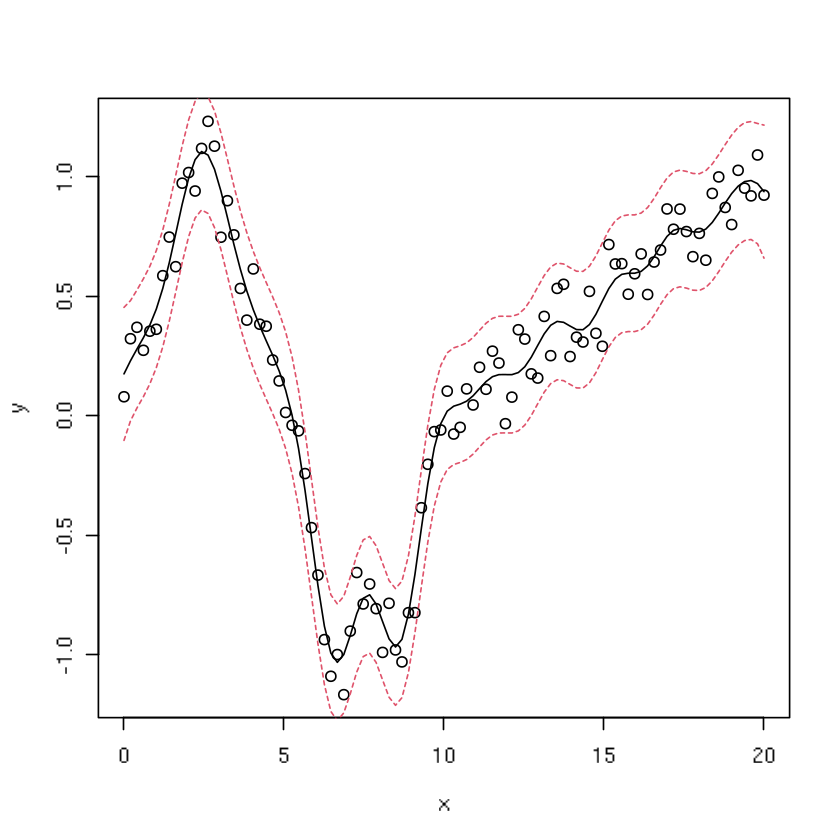

In [661]:
plot(X, y, xlab="x")
lines(X, p$mean)
lines(X, p$mean + 2*sqrt(p$s2), col=2, lty=2)
lines(X, p$mean - 2*sqrt(p$s2), col=2, lty=2)

In [676]:
left <- X < 9.6
gpl <- newGP(matrix(X[left], ncol=1), y[left], d=0.1, 
  g=0.1*var(y), dK=TRUE)
mlel <- jmleGP(gpl)
gpr <- newGP(matrix(X[!left], ncol=1), y[!left], d=0.1, 
  g=0.1*var(y), dK=TRUE)
mler <- jmleGP(gpr, drange=c(eps, 100)) 

In [677]:
pl <- predGP(gpl, matrix(X[left], ncol=1), lite=TRUE)
deleteGP(gpl)
pr <- predGP(gpr, matrix(X[!left], ncol=1), lite=TRUE)
deleteGP(gpr)

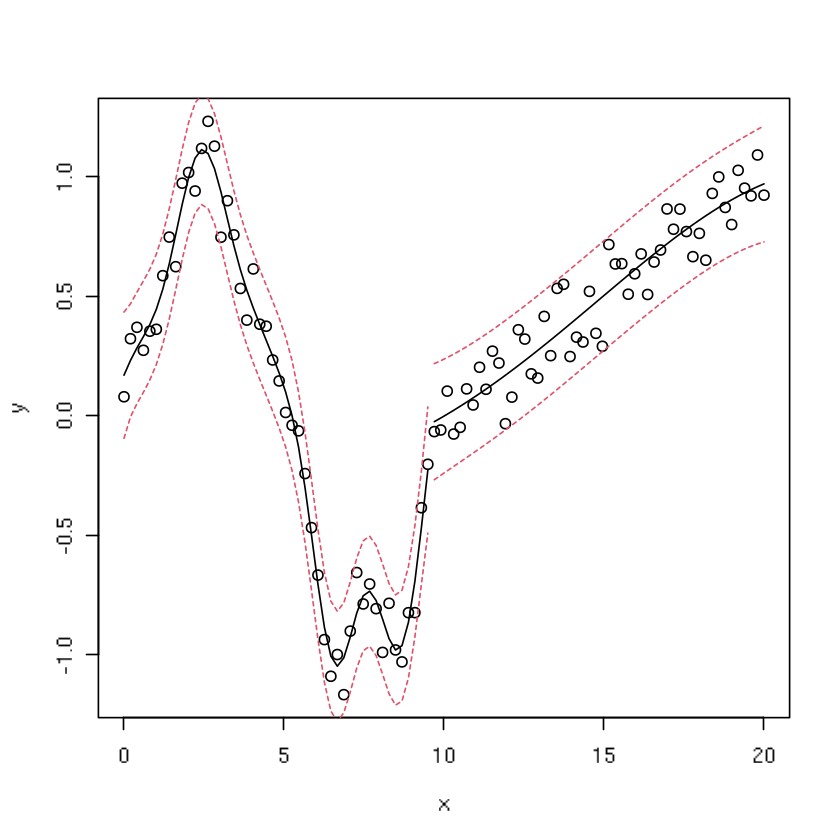

In [678]:
plot(X, y, xlab="x")
lines(X[left], pl$mean)
lines(X[left], pl$mean + 2*sqrt(pl$s2), col=2, lty=2)
lines(X[left], pl$mean - 2*sqrt(pl$s2), col=2, lty=2)
lines(X[!left], pr$mean)
lines(X[!left], pr$mean + 2*sqrt(pr$s2), col=2, lty=2)
lines(X[!left], pr$mean - 2*sqrt(pr$s2), col=2, lty=2)

In [679]:
rbind(mlel = mlel, mler = mler)

,d,g,tot.its,dits,gits
,<dbl>,<dbl>,<int>,<int>,<int>
mlel,1.746876,0.02855037,38,20,18
mler,99.999998,0.03604860,3927,3924,3
